## 1.0 - Importing packages

In [4]:
import os
import numpy as np
from sklearn import datasets
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.svm import LinearSVC
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

from sklearn import svm
import seaborn as sb
import pandas as pd
import numpy as np
import itertools

from sklearn.svm import LinearSVC as SVC
import matplotlib as mpl
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings('ignore')

import plotly as ply


## 2.0 - Functions

In [5]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

def print_score(clf, X_train, y_train, X_test, y_test, train=True):
    if train:
        pred = clf.predict(X_train)
        clf_report = pd.DataFrame(classification_report(y_train, pred, output_dict=True))
        print("Train Result:\n================================================")
        print(f"Accuracy Score: {accuracy_score(y_train, pred) * 100:.2f}%")
        print("_______________________________________________")
        print(f"CLASSIFICATION REPORT:\n{clf_report}")
        print("_______________________________________________")
        print(f"Confusion Matrix: \n {confusion_matrix(y_train, pred)}\n")
        
    elif train==False:
        pred = clf.predict(X_test)
        clf_report = pd.DataFrame(classification_report(y_test, pred, output_dict=True))
        print("Test Result:\n================================================")        
        print(f"Accuracy Score: {accuracy_score(y_test, pred) * 100:.2f}%")
        print("_______________________________________________")
        print(f"CLASSIFICATION REPORT:\n{clf_report}")
        print("_______________________________________________")
        print(f"Confusion Matrix: \n {confusion_matrix(y_test, pred)}\n")

## 3.0 - Dataset

### 01 - NearMiss Under-sampling

<AxesSubplot:xlabel='OverallPoF', ylabel='count'>

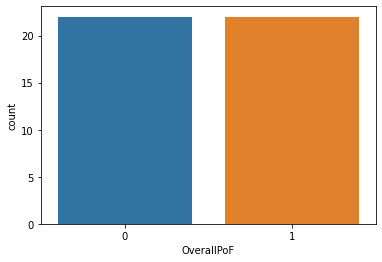

In [7]:
X_train1=pd.read_csv("C:\\Users\\AndyJ\\12-Ears\\P1\\03 - Code\\00 - Dataset\\03 - Sampling Splits\\01 - NM2\\X_train.csv")
X_test1=pd.read_csv("C:\\Users\\AndyJ\\12-Ears\\P1\\03 - Code\\00 - Dataset\\03 - Sampling Splits\\01 - NM2\\X_test.csv")
y_train1=pd.read_csv("C:\\Users\\AndyJ\\12-Ears\\P1\\03 - Code\\00 - Dataset\\03 - Sampling Splits\\01 - NM2\\y_train.csv")
y_test1=pd.read_csv("C:\\Users\\AndyJ\\12-Ears\\P1\\03 - Code\\00 - Dataset\\03 - Sampling Splits\\01 - NM2\\y_test.csv")
sb.countplot(y_train1['OverallPoF'],fill='OverallPoF')

In [8]:
X_train1=X_train1.filter(regex='fa',axis=1)
X_test1=X_test1.filter(regex='fa',axis=1)

### 02 - SMOTE Over-sampling

<AxesSubplot:xlabel='OverallPoF', ylabel='count'>

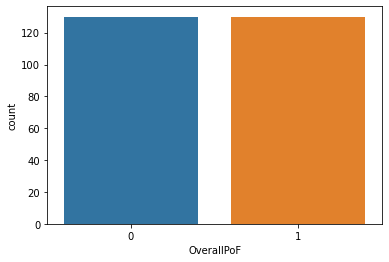

In [9]:
X_train2=pd.read_csv("C:\\Users\\AndyJ\\12-Ears\\P1\\03 - Code\\00 - Dataset\\03 - Sampling Splits\\02 - SMOTE\\X_train.csv")
X_test2=pd.read_csv("C:\\Users\\AndyJ\\12-Ears\\P1\\03 - Code\\00 - Dataset\\03 - Sampling Splits\\02 - SMOTE\\X_test.csv")
y_train2=pd.read_csv("C:\\Users\\AndyJ\\12-Ears\\P1\\03 - Code\\00 - Dataset\\03 - Sampling Splits\\02 - SMOTE\\y_train.csv")
y_test2=pd.read_csv("C:\\Users\\AndyJ\\12-Ears\\P1\\03 - Code\\00 - Dataset\\03 - Sampling Splits\\02 - SMOTE\\y_test.csv")
sb.countplot(y_train2['OverallPoF'],fill='OverallPoF')

In [10]:
X_train2=X_train2.filter(regex='fa',axis=1)
X_test2=X_test2.filter(regex='fa',axis=1)

### 03 - SMOTEENN

<AxesSubplot:xlabel='OverallPoF', ylabel='count'>

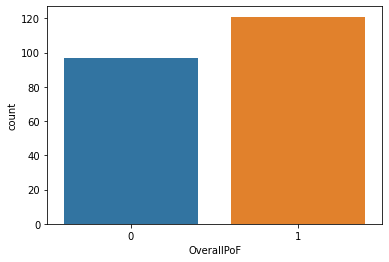

In [11]:
X_train3=pd.read_csv("C:\\Users\\AndyJ\\12-Ears\\P1\\03 - Code\\00 - Dataset\\03 - Sampling Splits\\03 - SMOTEENN\\X_train.csv")
X_test3=pd.read_csv("C:\\Users\\AndyJ\\12-Ears\\P1\\03 - Code\\00 - Dataset\\03 - Sampling Splits\\03 - SMOTEENN\\X_test.csv")
y_train3=pd.read_csv("C:\\Users\\AndyJ\\12-Ears\\P1\\03 - Code\\00 - Dataset\\03 - Sampling Splits\\03 - SMOTEENN\\y_train.csv")
y_test3=pd.read_csv("C:\\Users\\AndyJ\\12-Ears\\P1\\03 - Code\\00 - Dataset\\03 - Sampling Splits\\03 - SMOTEENN\\y_test.csv")
sb.countplot(y_train3['OverallPoF'],fill='OverallPoF')

In [12]:
X_train3.head()

,Gender,AgeM,ECV,TPP,SC,OAE1,OAE1.4,OAE2,OAE2.8,OAE4,...,fp6168,fp6349,fp6535,fp6727,fp6924,fp7127,fp7336,fp7550,fp7772,fp8000
0,0,97,1.01,-78,0.84,14.7,22.9,19.2,7.5,10.6,...,-88.8839,-88.8359,-90.6649,-90.3674,-88.3935,-91.0641,-92.7877,-114.7202,122.4531,112.2305
1,1,117,0.71,3,0.47,21.0,18.0,22.0,15.0,11.0,...,-51.7346,-22.2277,50.3318,80.6503,82.6362,86.7219,87.6202,90.5000,91.0953,93.3113
2,1,104,0.88,-11,0.46,9.5,11.3,11.1,13.5,11.1,...,136.2679,102.0953,97.2395,94.3545,90.6787,89.1412,87.2806,86.4388,84.9723,83.5814
3,0,102,0.80,-8,0.70,4.0,7.0,11.0,15.0,15.0,...,-49.2873,-42.2230,-25.7535,6.9751,24.5090,46.7996,62.4586,73.2916,75.2660,80.3582
4,0,106,1.54,-11,0.78,3.0,22.0,20.0,17.0,20.0,...,-70.2761,-65.7322,-58.6314,-41.7434,-23.7137,10.4994,41.8514,60.6193,67.1151,72.2054


In [13]:
X_train3=X_train3.filter(regex='fa',axis=1)
X_test3=X_test3.filter(regex='fa',axis=1)

### 04 - SMOTETomek

<AxesSubplot:xlabel='OverallPoF', ylabel='count'>

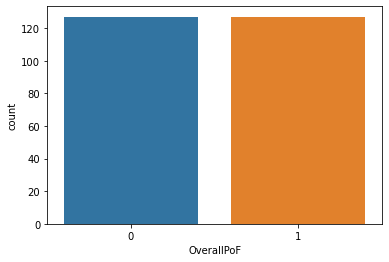

In [14]:
X_train4=pd.read_csv("C:\\Users\\AndyJ\\12-Ears\\P1\\03 - Code\\00 - Dataset\\03 - Sampling Splits\\04 - SMOTETomek\\X_train.csv")
X_test4=pd.read_csv("C:\\Users\\AndyJ\\12-Ears\\P1\\03 - Code\\00 - Dataset\\03 - Sampling Splits\\04 - SMOTETomek\\X_test.csv")
y_train4=pd.read_csv("C:\\Users\\AndyJ\\12-Ears\\P1\\03 - Code\\00 - Dataset\\03 - Sampling Splits\\04 - SMOTETomek\\y_train.csv")
y_test4=pd.read_csv("C:\\Users\\AndyJ\\12-Ears\\P1\\03 - Code\\00 - Dataset\\03 - Sampling Splits\\04 - SMOTETomek\\y_test.csv")
sb.countplot(y_train4['OverallPoF'],fill='OverallPoF')

In [15]:
X_train4=X_train4.filter(regex='fa',axis=1)
X_test4=X_test4.filter(regex='fa',axis=1)

In [76]:
data=pd.concat([X_train1,y_train1],axis=1)
data.head(10)

,fa226,fa257,fa280,fa297,fa324,fa343,fa363,fa385,fa408,fa432,...,fa6349,fa6535,fa6727,fa6924,fa7127,fa7336,fa7550,fa7772,fa8000,OverallPoF
0,0.0367,0.0695,0.1020,0.1197,0.1179,0.1134,0.1245,0.1517,0.1655,0.1654,...,0.7856,0.7557,0.7254,0.7221,0.7165,0.7227,0.7315,0.7276,0.7365,0
1,0.0543,0.0949,0.1344,0.1536,0.1500,0.1458,0.1568,0.1857,0.1996,0.2001,...,0.5586,0.5065,0.4641,0.4404,0.4012,0.3877,0.3645,0.3769,0.3716,0
2,0.0465,0.0646,0.0850,0.0910,0.0821,0.0702,0.0688,0.0787,0.0863,0.0863,...,0.2819,0.2392,0.2582,0.2484,0.2146,0.1760,0.1441,0.1456,0.0965,0
3,0.1032,0.1082,0.1242,0.1443,0.1612,0.1677,0.1646,0.1442,0.1254,0.1146,...,0.3523,0.2883,0.2685,0.2427,0.2375,0.2172,0.2117,0.1888,0.1643,0
4,0.0802,0.1075,0.1381,0.1499,0.1418,0.1305,0.1347,0.1555,0.1741,0.1812,...,0.3303,0.2894,0.3037,0.2970,0.2558,0.2121,0.1836,0.1937,0.1499,0
5,0.0663,0.0757,0.0951,0.1212,0.1458,0.1602,0.1606,0.1482,0.1301,0.1290,...,0.2760,0.2124,0.1845,0.1468,0.1231,0.0961,0.0916,0.0789,0.0586,0
6,0.0524,0.0564,0.0774,0.1048,0.1288,0.1399,0.1401,0.1199,0.0998,0.0847,...,0.4716,0.4380,0.4373,0.4136,0.3931,0.3561,0.3559,0.3310,0.3081,0
7,0.1663,0.1928,0.2201,0.2301,0.2189,0.2040,0.2028,0.2147,0.2256,0.2279,...,0.3200,0.2976,0.3168,0.3037,0.2619,0.2224,0.1891,0.1912,0.1476,0
8,0.0348,0.0649,0.0960,0.1098,0.1087,0.1043,0.1123,0.1316,0.1441,0.1446,...,0.1945,0.1307,0.1038,0.0963,0.0601,0.0519,0.0269,0.0382,0.0127,0
9,0.1332,0.1526,0.1911,0.2357,0.2740,0.2972,0.3041,0.2987,0.2837,0.2870,...,0.9164,0.8979,0.8954,0.8797,0.8558,0.8166,0.7740,0.7569,0.7252,0


## 3.1 - EDA

In [106]:
plot_data=pd.melt(data,'OverallPoF')
plot_data['PoF'] = np.where(plot_data['OverallPoF']==0, 'Pass', 'Fail')
plot_data.head(10)

,OverallPoF,variable,value,PoF
0,0,fa226,0.0367,Pass
1,0,fa226,0.0543,Pass
2,0,fa226,0.0465,Pass
3,0,fa226,0.1032,Pass
4,0,fa226,0.0802,Pass
5,0,fa226,0.0663,Pass
6,0,fa226,0.0524,Pass
7,0,fa226,0.1663,Pass
8,0,fa226,0.0348,Pass
9,0,fa226,0.1332,Pass


<AxesSubplot:xlabel='variable', ylabel='value'>

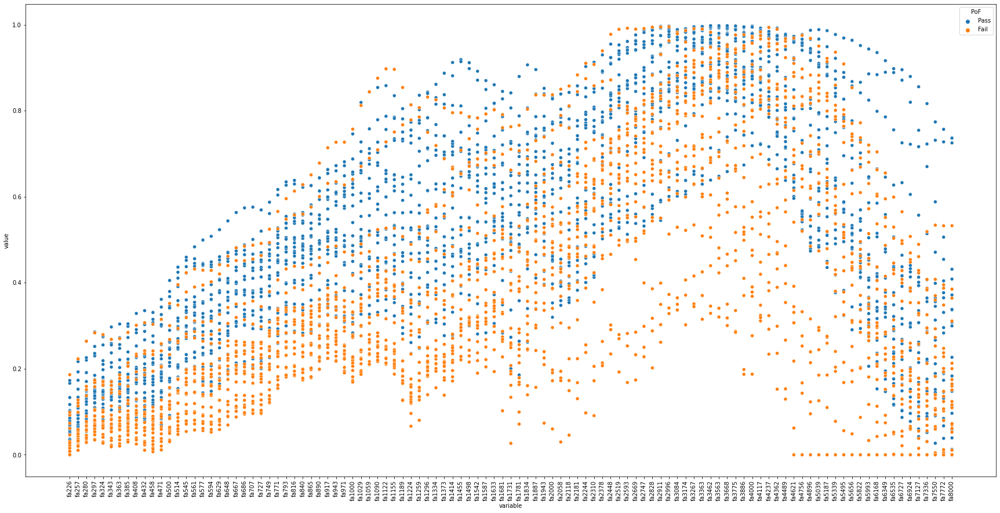

In [107]:
plt.figure(figsize=(30, 15))
plt.xticks(rotation=90)
sb.scatterplot(data=plot_data,x="variable",y="value",hue="PoF")


<AxesSubplot:xlabel='variable', ylabel='value'>

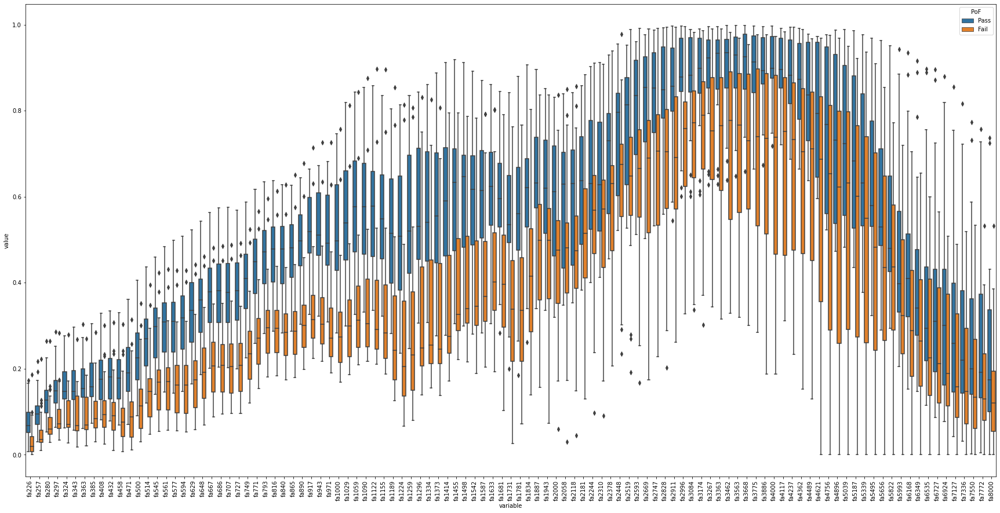

In [108]:
plt.figure(figsize=(30, 15))
plt.xticks(rotation=90)
sb.boxplot(data=plot_data,x="variable",y="value",hue="PoF")

#### Multi-collinearity

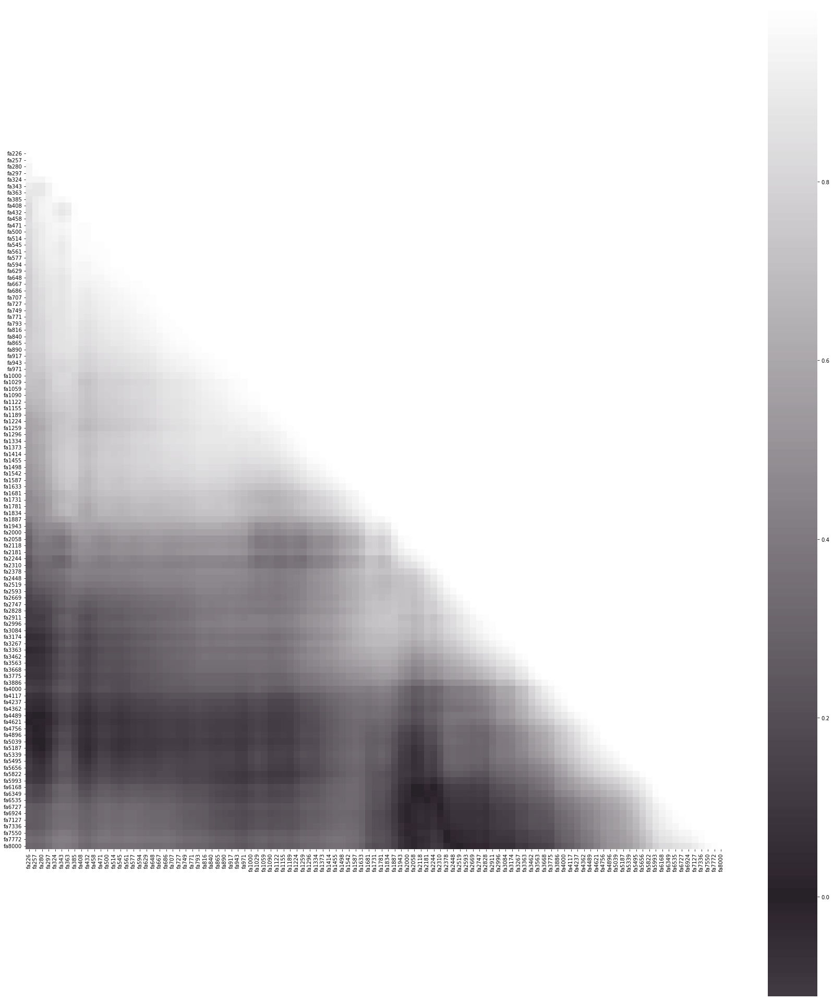

In [60]:

corr = X_train1.corr()

# Create a mask
mask = np.triu(np.ones_like(corr, dtype=bool))

# Create a custom divergin palette
cmap = sb.diverging_palette(0, 0, s=100,l=100,center='dark',as_cmap=True)

plt.figure(figsize=(30, 35))
sb.heatmap(corr, mask=mask, center=0, annot=False,
            fmt='.2f', square=True, cmap=cmap)

plt.show();

In [69]:
corr.sum(axis=1).sort_values().head(50)

fa8000    35.188995
fa6924    36.209187
fa7127    36.288280
fa7336    36.339832
fa6535    36.737777
fa7550    36.744642
fa5039    36.970179
fa6349    36.975659
fa5993    36.989762
fa6727    37.147483
fa5822    37.363948
fa5187    37.456797
fa7772    37.678701
fa4896    37.684735
fa6168    37.868597
fa4756    37.891543
fa5656    38.193282
fa5339    38.371327
fa4621    38.495502
fa5495    38.586769
fa4489    39.667254
fa4362    40.315473
fa4237    41.175682
fa4117    42.454263
fa4000    44.502358
fa3886    47.053484
fa2244    47.529667
fa3775    47.616820
fa2310    48.648742
fa2118    48.900336
fa3668    49.041425
fa2058    49.103777
fa226     49.238330
fa2828    49.422021
fa3363    49.637021
fa3563    49.654723
fa3174    49.707046
fa2669    50.156049
fa2747    50.424314
fa3462    50.610310
fa2911    50.934107
fa3084    51.087508
fa2593    51.129460
fa257     51.173750
fa2181    51.310376
fa3267    51.500017
fa2519    51.727646
fa2996    52.389243
fa2448    52.390258
fa280     52.478723


## 4.0 - Feature Selection

### 01 - Filter Methods

### Manual One-way ANOVA

In [136]:
from scipy.stats import f_oneway

plot_data=pd.melt(data,'OverallPoF')
plot_data['PoF'] = np.where(plot_data['OverallPoF']==0, 'Pass', 'Fail')


,OverallPoF,variable,value,PoF
0,0,fa226,0.0367,Pass
1,0,fa226,0.0543,Pass
2,0,fa226,0.0465,Pass
3,0,fa226,0.1032,Pass
4,0,fa226,0.0802,Pass
5,0,fa226,0.0663,Pass
6,0,fa226,0.0524,Pass
7,0,fa226,0.1663,Pass
8,0,fa226,0.0348,Pass
9,0,fa226,0.1332,Pass


In [139]:
passes=plot_data.loc[(plot_data['variable']=='fa226') & (plot_data['PoF']=='Pass')].value

In [140]:
fails=plot_data.loc[(plot_data['variable']=='fa226') & (plot_data['PoF']=='Fail')].value

In [156]:
f_stat=[]
p_val=[]
for i in set(X_train1.columns.values):
    passes=plot_data.loc[(plot_data['variable']==i) & (plot_data['PoF']=='Pass')].value
    fails=plot_data.loc[(plot_data['variable']==i) & (plot_data['PoF']=='Fail')].value
    f_stat.append(f_oneway(passes,fails)[0])
    p_val.append(f_oneway(passes,fails)[1])

22.51402895417132

In [ ]:
for i in unique(

#### 01 - SelectKBest

##### 01 - Nearmiss Results

In [109]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif
X=X_train1
y=y_train1
X_new1 = SelectKBest(f_classif, k=10).fit(X, y)

In [110]:
mask1=X_new1.get_support()
new_feat1 = [] 
for bool, feature in zip(mask1, X_train1.columns):
    if bool:
        new_feat1.append(feature)
print("The best features are:{}".format(new_feat1))

The best features are:['fa727', 'fa749', 'fa771', 'fa793', 'fa816', 'fa840', 'fa865', 'fa890', 'fa917', 'fa1000']


##### 02 - SMOTE Results

In [111]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif
X=X_train2
y=y_train2
X_new2 = SelectKBest(f_classif, k=10).fit(X, y)

In [112]:
mask2=X_new2.get_support()
new_feat2 = [] 
for bool, feature in zip(mask2, X_train2.columns):
    if bool:
        new_feat2.append(feature)
print("The best features are:{}".format(new_feat2))

The best features are:['fa1059', 'fa1090', 'fa1122', 'fa1155', 'fa1189', 'fa1224', 'fa1296', 'fa1334', 'fa1373', 'fa1414']


##### 03 - SMOTEENN Results

In [113]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif
X=X_train3
y=y_train3
X_new3 = SelectKBest(f_classif, k=10).fit(X, y)

In [114]:
mask3=X_new3.get_support()
new_feat3 = [] 
for bool, feature in zip(mask3, X_train3.columns):
    if bool:
        new_feat3.append(feature)
print("The best features are:{}".format(new_feat3))

The best features are:['fa1090', 'fa1155', 'fa1189', 'fa1224', 'fa1259', 'fa1296', 'fa1334', 'fa1373', 'fa1414', 'fa1455']


##### 04 - SMOTETomek Results

In [124]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif
X=X_train4
y=y_train4
X_new4 = SelectKBest(f_classif, k=10).fit(X, y)

In [125]:
mask4=X_new4.get_support()
new_feat4 = [] 
for bool, feature in zip(mask4, X_train4.columns):
    if bool:
        new_feat4.append(feature)
print("The best features are:{}".format(new_feat4))

The best features are:['fa1029', 'fa1059', 'fa1090', 'fa1122', 'fa1155', 'fa1189', 'fa1224', 'fa1259', 'fa1296', 'fa1334']


#### 02 - K-Means Clustering

##### 01 - Nearmiss Results

##### 02 - SMOTE Results

##### 03 - SMOTEENN Results

##### 04 - SMOTETomek Results

### 02 - Wrapper Methods

#### 01 - Recursive Feature Elimination (RFE)

##### 01 - Nearmiss Results

Optimal number of features : 6


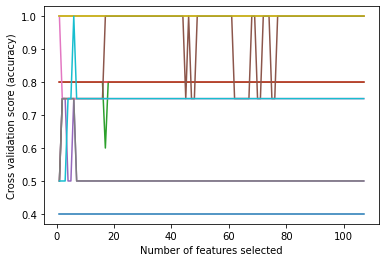

In [23]:
import matplotlib.pyplot as plt
from sklearn.svm import SVC
from sklearn.model_selection import StratifiedKFold
from sklearn.feature_selection import RFECV
from sklearn.datasets import make_classification


# Create the RFE object and compute a cross-validated score.
svc = SVC(kernel="linear")
# The "accuracy" scoring shows the proportion of correct classifications

min_features_to_select = 1  # Minimum number of features to consider
rfecv = RFECV(
    estimator=svc,
    step=1,
    cv=StratifiedKFold(10),
    scoring="accuracy",
    min_features_to_select=min_features_to_select,
)
rfecv.fit(X_train1, y_train1)

print("Optimal number of features : %d" % rfecv.n_features_)

# Plot number of features VS. cross-validation scores
plt.figure()
plt.xlabel("Number of features selected")
plt.ylabel("Cross validation score (accuracy)")
plt.plot(
    range(min_features_to_select, len(rfecv.grid_scores_) + min_features_to_select),
    rfecv.grid_scores_,
)
plt.show()

In [24]:
ranking = pd.DataFrame(rfecv.ranking_, columns = ['Ranking'])
features=pd.DataFrame(X_train1.columns.values[rfecv.ranking_],columns=['Features'])
# feature_rank=pd.concat([ranking,features],axis=1)
smote_rfe_bestf=X_train1.columns[rfecv.support_]
smote_rfe_bestf_total=X_train1.columns[rfecv.support_].size

In [25]:
print("Best features:", X_train1.columns[rfecv.support_])

Best features: Index(['fa1000', 'fa1090', 'fa1122', 'fa2747', 'fa4000', 'fa4117'], dtype='object')


##### 02 - SMOTE Results

Optimal number of features : 16


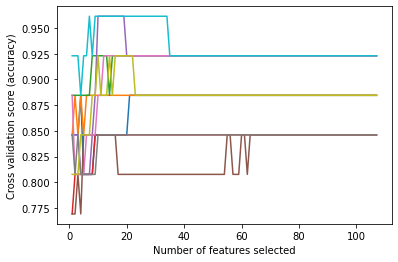

In [22]:
import matplotlib.pyplot as plt
from sklearn.svm import SVC
from sklearn.model_selection import StratifiedKFold
from sklearn.feature_selection import RFECV
from sklearn.datasets import make_classification


# Create the RFE object and compute a cross-validated score.
svc = SVC(kernel="linear")
# The "accuracy" scoring shows the proportion of correct classifications

min_features_to_select = 1  # Minimum number of features to consider
rfecv2 = RFECV(
    estimator=svc,
    step=1,
    cv=StratifiedKFold(10),
    scoring="accuracy",
    min_features_to_select=min_features_to_select,
)
rfecv2.fit(X_train2, y_train2)

print("Optimal number of features : %d" % rfecv2.n_features_)

# Plot number of features VS. cross-validation scores
plt.figure()
plt.xlabel("Number of features selected")
plt.ylabel("Cross validation score (accuracy)")
plt.plot(
    range(min_features_to_select, len(rfecv2.grid_scores_) + min_features_to_select),
    rfecv2.grid_scores_,
)
plt.show()

In [18]:
ranking = pd.DataFrame(rfecv.ranking_, columns = ['Ranking'])
features=pd.DataFrame(X_train2.columns.values[rfecv.ranking_],columns=['Features'])
# feature_rank=pd.concat([ranking,features],axis=1)
smote_rfe_bestf=X_train2.columns[rfecv.support_]
smote_rfe_bestf_total=X_train2.columns[rfecv.support_].size

In [19]:
print("Best features:", X_train2.columns[rfecv.support_])

Best features: Index(['fa1029', 'fa1059', 'fa1090', 'fa1296', 'fa1781', 'fa1834', 'fa1887',
       'fa2118', 'fa2181', 'fa2911', 'fa3084', 'fa3174', 'fa3363', 'fa4000',
       'fa4117', 'fa5039'],
      dtype='object')


##### 03 - SMOTEENN Results

Optimal number of features : 11


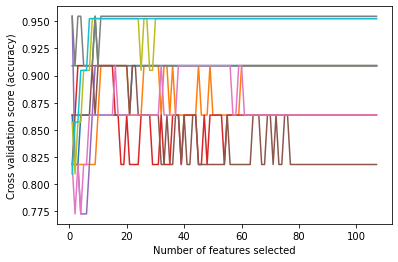

In [26]:
import matplotlib.pyplot as plt
from sklearn.svm import SVC
from sklearn.model_selection import StratifiedKFold
from sklearn.feature_selection import RFECV
from sklearn.datasets import make_classification


# Create the RFE object and compute a cross-validated score.
svc = SVC(kernel="linear")
# The "accuracy" scoring shows the proportion of correct classifications

min_features_to_select = 1  # Minimum number of features to consider
rfecv3 = RFECV(
    estimator=svc,
    step=1,
    cv=StratifiedKFold(10),
    scoring="accuracy",
    min_features_to_select=min_features_to_select,
)
rfecv3.fit(X_train3, y_train3)

print("Optimal number of features : %d" % rfecv3.n_features_)

# Plot number of features VS. cross-validation scores
plt.figure()
plt.xlabel("Number of features selected")
plt.ylabel("Cross validation score (accuracy)")
plt.plot(
    range(min_features_to_select, len(rfecv3.grid_scores_) + min_features_to_select),
    rfecv3.grid_scores_,
)
plt.show()

In [27]:
ranking = pd.DataFrame(rfecv3.ranking_, columns = ['Ranking'])
features=pd.DataFrame(X_train3.columns.values[rfecv3.ranking_],columns=['Features'])
# feature_rank=pd.concat([ranking,features],axis=1)
smote_rfe_bestf=X_train3.columns[rfecv.support_]
smote_rfe_bestf_total=X_train3.columns[rfecv.support_].size

In [28]:
print("Best features:", X_train3.columns[rfecv3.support_])

Best features: Index(['fa1090', 'fa1259', 'fa1296', 'fa1334', 'fa2118', 'fa2181', 'fa2911',
       'fa3174', 'fa4000', 'fa4896', 'fa6349'],
      dtype='object')


##### 04 - SMOTETomek Results

Optimal number of features : 28


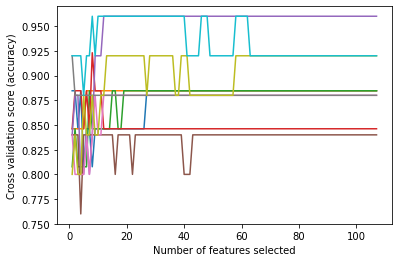

In [32]:
import matplotlib.pyplot as plt
from sklearn.svm import SVC
from sklearn.model_selection import StratifiedKFold
from sklearn.feature_selection import RFECV
from sklearn.datasets import make_classification


# Create the RFE object and compute a cross-validated score.
svc = SVC(kernel="linear")
# The "accuracy" scoring shows the proportion of correct classifications

min_features_to_select = 1  # Minimum number of features to consider
rfecv4 = RFECV(
    estimator=svc,
    step=1,
    cv=StratifiedKFold(10),
    scoring="accuracy",
    min_features_to_select=min_features_to_select,
)
rfecv4.fit(X_train4, y_train4)

print("Optimal number of features : %d" % rfecv4.n_features_)

# Plot number of features VS. cross-validation scores
plt.figure()
plt.xlabel("Number of features selected")
plt.ylabel("Cross validation score (accuracy)")
plt.plot(
    range(min_features_to_select, len(rfecv4.grid_scores_) + min_features_to_select),
    rfecv4.grid_scores_,
)
plt.show()

In [33]:
ranking = pd.DataFrame(rfecv4.ranking_, columns = ['Ranking'])
features=pd.DataFrame(X_train4.columns.values[rfecv4.ranking_],columns=['Features'])
# feature_rank=pd.concat([ranking,features],axis=1)
smote_rfe_bestf=X_train4.columns[rfecv4.support_]
smote_rfe_bestf_total=X_train4.columns[rfecv4.support_].size

In [35]:
print("Best features:", X_train4.columns[rfecv4.support_])

Best features: Index(['fa771', 'fa1029', 'fa1059', 'fa1090', 'fa1122', 'fa1259', 'fa1296',
       'fa1781', 'fa1834', 'fa1887', 'fa2058', 'fa2118', 'fa2181', 'fa2244',
       'fa2911', 'fa3084', 'fa3174', 'fa3267', 'fa3363', 'fa4000', 'fa4117',
       'fa4237', 'fa4756', 'fa4896', 'fa5039', 'fa5495', 'fa5656', 'fa5993'],
      dtype='object')


#### 02 - Recursive Feature Elimination (Random Forest Classifier)

##### 01 - Nearmiss Results

Optimal number of features : 9
Best features : ['fa226', 'fa280', 'fa749', 'fa816', 'fa1029', 'fa1090', 'fa2996', 'fa3668', 'fa5656']


<AxesSubplot:xlabel='f_importance', ylabel='name'>

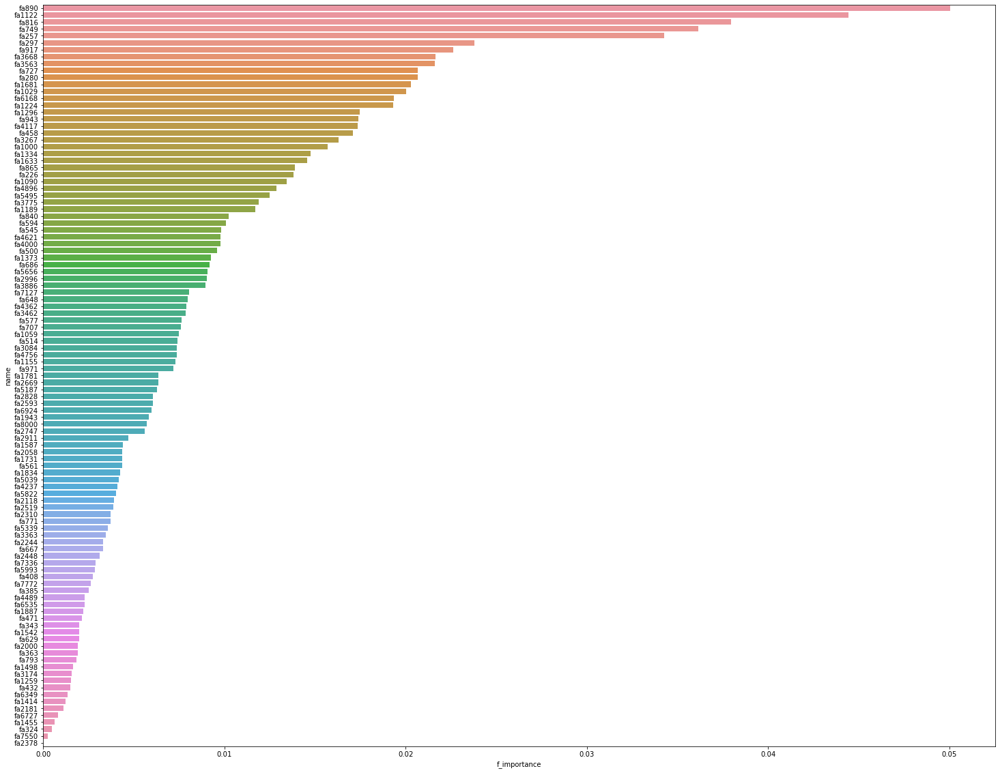

In [214]:
from sklearn.feature_selection import RFECV
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification
cv_estimator = RandomForestClassifier(random_state =12)

cv_estimator.fit(X_train1, y_train1)
cv_selector = RFECV(cv_estimator,cv= 5, step=1,scoring='accuracy')
cv_selector = cv_selector.fit(X_train1, y_train1)
rfecv_mask = cv_selector.get_support() #list of booleans
rfecv_features = [] 
for bool, feature in zip(rfecv_mask, X_train1.columns):
    if bool:
        rfecv_features.append(feature)
print('Optimal number of features :', cv_selector.n_features_)
print('Best features :', rfecv_features)
n_features = X_train1.shape[1]

n1=np.arange(n_features)
v1=X_train1.columns.values
f1=cv_estimator.feature_importances_

rfecv_rf_1=pd.DataFrame({'idx':n1,'name':v1,'f_importance':f1})
rfecv_rf_1

plt.figure(figsize=(25,20))
sb.barplot(x='f_importance',
            y="name", 
            data=rfecv_rf_1, 
            order=rfecv_rf_1.sort_values('f_importance',ascending=False).name)

##### 02 - SMOTE Results

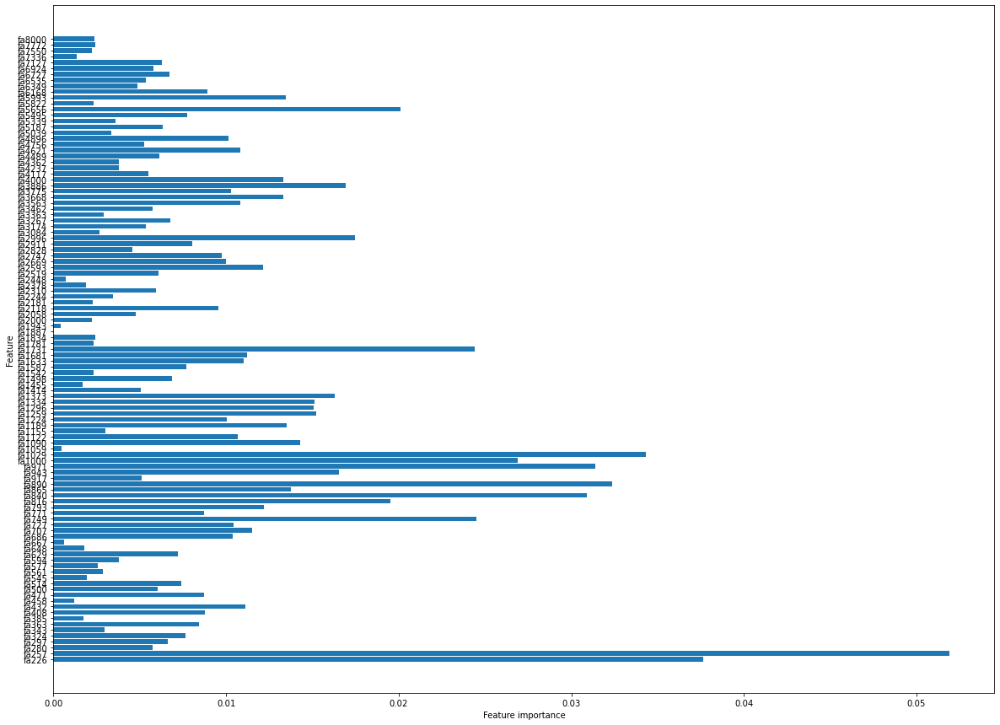

In [173]:
from sklearn.feature_selection import RFECV
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification
cv_estimator = RandomForestClassifier(random_state =12)

cv_estimator.fit(X_train2, y_train2)
cv_selector = RFECV(cv_estimator,cv= 5, step=1,scoring='accuracy')
cv_selector = cv_selector.fit(X_train2, y_train2)
rfecv_mask = cv_selector.get_support() #list of booleans
rfecv_features = [] 
for bool, feature in zip(rfecv_mask, X_train2.columns):
    if bool:
        rfecv_features.append(feature)
print('Optimal number of features :', cv_selector.n_features_)
print('Best features :', rfecv_features)
n_features = X_train2.shape[1]

n2=np.arange(n_features)
v2=X_train2.columns.values
f2=cv_estimator.feature_importances_

rfecv_rf_2=pd.DataFrame({'idx':n2,'name':v2,'f_importance':f2})
rfecv_rf_2

plt.figure(figsize=(25,20))
sb.barplot(x='f_importance',
            y="name", 
            data=rfecv_rf_2, 
            order=rfecv_rf_2.sort_values('f_importance',ascending=False).name)

##### 03 - SMOTEENN Results

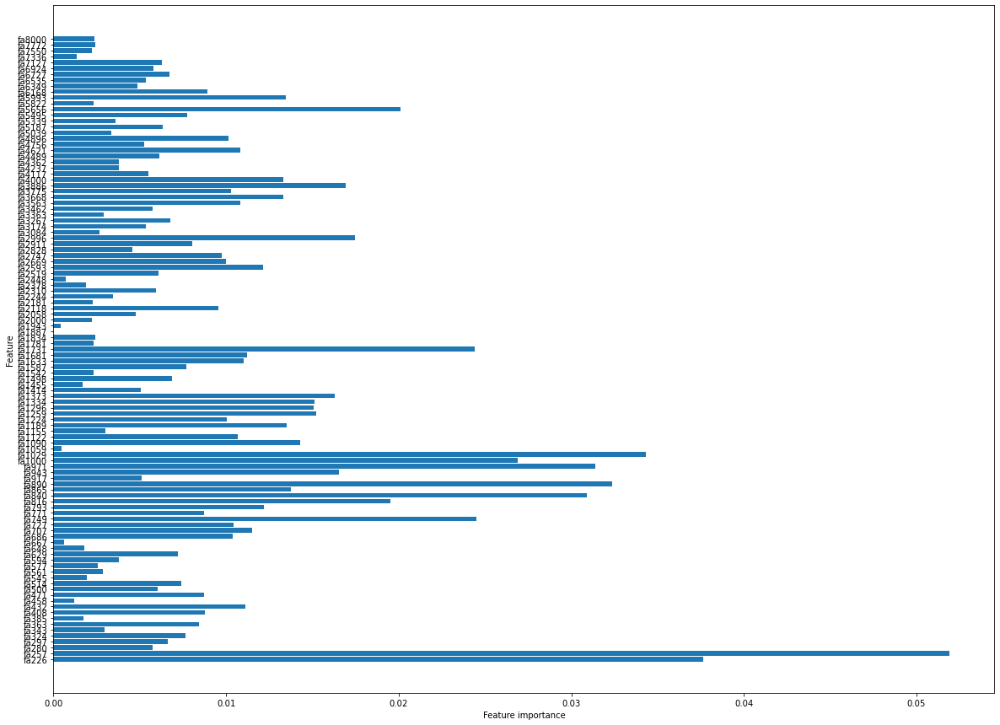

In [173]:
from sklearn.feature_selection import RFECV
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification
cv_estimator = RandomForestClassifier(random_state =12)

cv_estimator.fit(X_train3, y_train3)
cv_selector = RFECV(cv_estimator,cv= 5, step=1,scoring='accuracy')
cv_selector = cv_selector.fit(X_train3, y_train3)
rfecv_mask = cv_selector.get_support() #list of booleans
rfecv_features = [] 
for bool, feature in zip(rfecv_mask, X_train3.columns):
    if bool:
        rfecv_features.append(feature)
print('Optimal number of features :', cv_selector.n_features_)
print('Best features :', rfecv_features)
n_features = X_train3.shape[1]

n3=np.arange(n_features)
v3=X_train3.columns.values
f3=cv_estimator.feature_importances_

rfecv_rf_3=pd.DataFrame({'idx':n3,'name':v3,'f_importance':f3})
rfecv_rf_3

plt.figure(figsize=(25,20))
sb.barplot(x='f_importance',
            y="name", 
            data=rfecv_rf_3, 
            order=rfecv_rf_3.sort_values('f_importance',ascending=False).name)

##### 04 - SMOTETomek Results

In [199]:
from sklearn.feature_selection import RFECV
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification
cv_estimator = RandomForestClassifier(random_state =12)

cv_estimator.fit(X_train4, y_train4)
cv_selector = RFECV(cv_estimator,cv= 3, step=1,scoring='accuracy')
cv_selector = cv_selector.fit(X_train4, y_train4)
rfecv_mask = cv_selector.get_support() #list of booleans
rfecv_features = [] 
for bool, feature in zip(rfecv_mask, X_train4.columns):
    if bool:
        rfecv_features.append(feature)
print('Optimal number of features :', cv_selector.n_features_)
print('Best features :', rfecv_features)
n_features = X_train4.shape[1]

n4=np.arange(n_features)
v4=X_train4.columns.values
f4=cv_estimator.feature_importances_

rfecv_rf_4=pd.DataFrame({'idx':n4,'name':v4,'f_importance':f4})
rfecv_rf_4

plt.figure(figsize=(25,20))
sb.barplot(x='f_importance',
            y="name", 
            data=rfecv_rf_4, 
            order=rfecv_rf_4.sort_values('f_importance',ascending=False).name)

KeyboardInterrupt: 

#### 03 - Sequential Feature Selection

##### 01 - Nearmiss Results

In [96]:
from sklearn.neighbors import KNeighborsClassifier
from mlxtend.feature_selection import SequentialFeatureSelector as SFS

X = X_train1
y = y_train1
knn = KNeighborsClassifier(n_neighbors=4)


# Sequential Forward Selection
sfs = SFS(knn, 
          k_features=50, 
          forward=True, 
          floating=False, 
          scoring='accuracy',
          cv=3,
          n_jobs=-1)
sfs = sfs.fit(X, y)

print('\nSequential Forward Selection (k=3):')
print(sfs.k_feature_idx_)
print('CV Score:')
print(sfs.k_score_)

###################################################

# Sequential Backward Selection
sbs = SFS(knn, 
          k_features=10, 
          forward=False, 
          floating=False, 
          scoring='accuracy',
          cv=3,
          n_jobs=-1)
sbs = sbs.fit(X, y)

print('\nSequential Backward Selection (k=3):')
print(sbs.k_feature_idx_)
print('CV Score:')
print(sbs.k_score_)

###################################################

# sfs.subsets_ # shows each k_feature and score
# sfs.k_feature_idx_  # Shows feature index
# sfs.k_feature_names_  # Shows best features selected


# sbs.subsets_ # shows each k_feature and score
# sbs.k_feature_idx_  # Shows feature index
# sbs.k_feature_names_  # Shows best features selected


Sequential Forward Selection (k=3):
(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 16, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 47, 51, 52, 53, 54, 55, 57, 60, 74, 76)
CV Score:
0.8428571428571429


In [92]:
pd.DataFrame.from_dict(sfs.get_metric_dict()).T

,feature_idx,cv_scores,avg_score,feature_names,ci_bound,std_dev,std_err
1,"(53,)","[0.7333333333333333, 0.9333333333333333, 0.785...",0.81746,"(fa1731,)",0.190556,0.084679,0.059877
2,"(37, 53)","[0.8, 0.8666666666666667, 0.9285714285714286]",0.865079,"(fa1090, fa1731)",0.118145,0.052501,0.037124
3,"(8, 37, 53)","[0.8666666666666667, 0.8666666666666667, 0.928...",0.887302,"(fa408, fa1090, fa1731)",0.06567,0.029182,0.020635
4,"(0, 8, 37, 53)","[0.8666666666666667, 0.8666666666666667, 0.928...",0.887302,"(fa226, fa408, fa1090, fa1731)",0.06567,0.029182,0.020635
5,"(0, 8, 37, 40, 53)","[0.8666666666666667, 0.8666666666666667, 0.928...",0.887302,"(fa226, fa408, fa1090, fa1189, fa1731)",0.06567,0.029182,0.020635
6,"(0, 1, 8, 37, 40, 53)","[0.8666666666666667, 0.8666666666666667, 0.928...",0.887302,"(fa226, fa257, fa408, fa1090, fa1189, fa1731)",0.06567,0.029182,0.020635
7,"(0, 1, 8, 37, 40, 41, 53)","[0.8666666666666667, 0.8666666666666667, 0.928...",0.887302,"(fa226, fa257, fa408, fa1090, fa1189, fa1224, ...",0.06567,0.029182,0.020635
8,"(0, 1, 8, 37, 38, 40, 41, 53)","[0.8666666666666667, 0.8666666666666667, 0.928...",0.887302,"(fa226, fa257, fa408, fa1090, fa1122, fa1189, ...",0.06567,0.029182,0.020635
9,"(0, 1, 8, 37, 38, 40, 41, 43, 53)","[0.8, 0.8666666666666667, 0.9285714285714286]",0.865079,"(fa226, fa257, fa408, fa1090, fa1122, fa1189, ...",0.118145,0.052501,0.037124
10,"(0, 1, 8, 27, 37, 38, 40, 41, 43, 53)","[0.8, 0.8666666666666667, 0.9285714285714286]",0.865079,"(fa226, fa257, fa408, fa816, fa1090, fa1122, f...",0.118145,0.052501,0.037124


In [74]:
pd.DataFrame.from_dict(sbs.get_metric_dict()).T

,feature_idx,cv_scores,avg_score,feature_names,ci_bound,std_dev,std_err
107,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[0.8, 0.7333333333333333, 0.7142857142857143]",0.749206,"(fa226, fa257, fa280, fa297, fa324, fa343, fa3...",0.082697,0.036749,0.025985
106,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[0.8, 0.7333333333333333, 0.7142857142857143]",0.749206,"(fa226, fa257, fa280, fa297, fa324, fa343, fa3...",0.082697,0.036749,0.025985
105,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[0.8, 0.7333333333333333, 0.7142857142857143]",0.749206,"(fa226, fa257, fa280, fa297, fa324, fa343, fa3...",0.082697,0.036749,0.025985
104,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[0.8, 0.7333333333333333, 0.7142857142857143]",0.749206,"(fa226, fa257, fa280, fa297, fa324, fa343, fa3...",0.082697,0.036749,0.025985
103,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[0.8, 0.7333333333333333, 0.7142857142857143]",0.749206,"(fa226, fa257, fa280, fa297, fa324, fa343, fa3...",0.082697,0.036749,0.025985
...,...,...,...,...,...,...,...
14,"(14, 16, 17, 20, 21, 22, 41, 43, 47, 51, 55, 6...","[0.8666666666666667, 0.8666666666666667, 0.785...",0.839683,"(fa545, fa577, fa594, fa667, fa686, fa707, fa1...",0.085876,0.038161,0.026984
13,"(14, 17, 20, 21, 22, 41, 43, 47, 51, 55, 62, 9...","[0.8, 0.8666666666666667, 0.7857142857142857]",0.81746,"(fa545, fa594, fa667, fa686, fa707, fa1224, fa...",0.079391,0.03528,0.024946
12,"(17, 20, 21, 22, 41, 43, 47, 51, 55, 62, 98, 99)","[0.8, 0.8666666666666667, 0.7857142857142857]",0.81746,"(fa594, fa667, fa686, fa707, fa1224, fa1296, f...",0.079391,0.03528,0.024946
11,"(17, 20, 21, 41, 43, 47, 51, 55, 62, 98, 99)","[0.7333333333333333, 0.8666666666666667, 0.857...",0.819048,"(fa594, fa667, fa686, fa1224, fa1296, fa1455, ...",0.136671,0.060734,0.042945


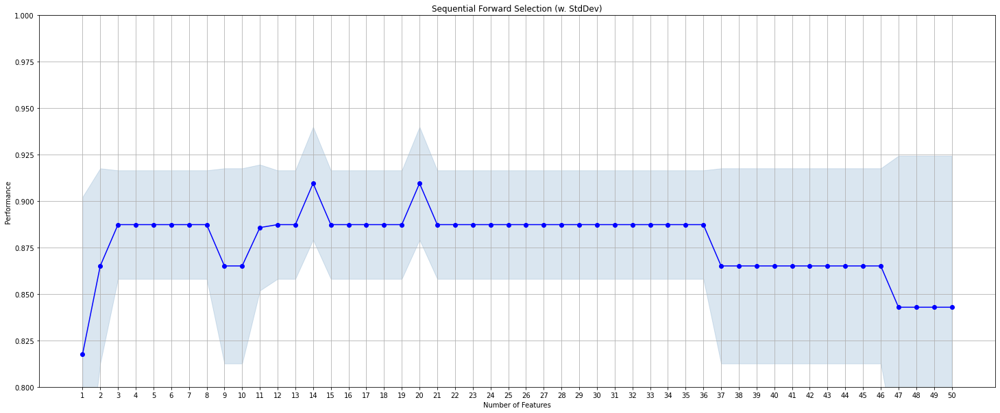

In [97]:
from mlxtend.plotting import plot_sequential_feature_selection as plot_sfs
import matplotlib.pyplot as plt
fig1 = plot_sfs(sfs.get_metric_dict(), kind='std_dev',figsize=(25,10))

plt.ylim([0.8, 1])
plt.title('Sequential Forward Selection (w. StdDev)')
plt.grid()
plt.show()

In [78]:
# sbs.subsets_ # shows each k_feature and score
# sbs.k_feature_idx_  # Shows feature index
# sbs.k_feature_names_  # Shows best features selected

('fa594',
 'fa667',
 'fa686',
 'fa1224',
 'fa1296',
 'fa1455',
 'fa1633',
 'fa1834',
 'fa2244',
 'fa6535')

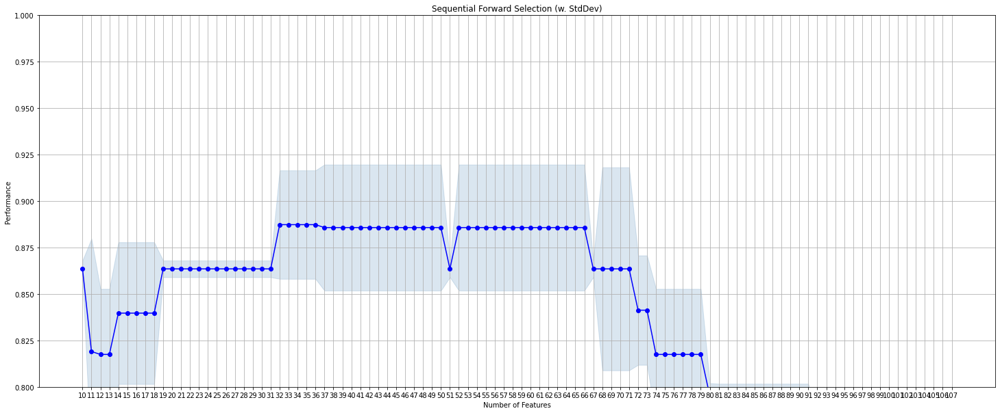

In [90]:
from mlxtend.plotting import plot_sequential_feature_selection as plot_sfs
import matplotlib.pyplot as plt


# fig1=plt.figure(figsize=(20,8), dpi= 100, facecolor='w', edgecolor='k')
plot_sfs(sbs.get_metric_dict(), kind='std_dev',figsize=(25,10))

plt.ylim([0.8, 1])
plt.title('Sequential Forward Selection (w. StdDev)')
plt.grid()
plt.show()


##### 02 - SMOTE Results

In [101]:
from sklearn.neighbors import KNeighborsClassifier
from mlxtend.feature_selection import SequentialFeatureSelector as sfs

X = X_train2
y = y_train2
knn = KNeighborsClassifier(n_neighbors=4)


# Sequential Forward Selection
sfs2 = sfs(knn, 
          k_features=50, 
          forward=True, 
          floating=False, 
          scoring='accuracy',
          cv=3,
          n_jobs=-1)
sfs2 = sfs2.fit(X, y)

print('\nSequential Forward Selection (k=3):')
print(sfs2.k_feature_idx_)
print('CV Score:')
print(sfs2.k_score_)

###################################################

# Sequential Backward Selection
sbs2 = sfs(knn, 
          k_features=10, 
          forward=False, 
          floating=False, 
          scoring='accuracy',
          cv=3,
          n_jobs=-1)
sbs2 = sbs2.fit(X, y)

print('\nSequential Backward Selection (k=3):')
print(sbs2.k_feature_idx_)
print('CV Score:')
print(sbs2.k_score_)

###################################################

# sfs2.subsets_ # shows each k_feature and score
# sfs2.k_feature_idx_  # Shows feature index
# sfs2.k_feature_names_  # Shows best features selected


# sbs2.subsets_ # shows each k_feature and score
# sbs2.k_feature_idx_  # Shows feature index
# sbs2.k_feature_names_  # Shows best features selected


Sequential Forward Selection (k=3):
(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 43, 46, 47, 48, 49, 50, 51, 100, 101, 102, 103, 105, 106)
CV Score:
0.9307226231845317

Sequential Backward Selection (k=3):
(9, 10, 12, 22, 38, 40, 58, 74, 82, 100)
CV Score:
0.9308117259199857


In [102]:
pd.DataFrame.from_dict(sfs2.get_metric_dict()).T

,feature_idx,cv_scores,avg_score,feature_names,ci_bound,std_dev,std_err
1,"(35,)","[0.8045977011494253, 0.8160919540229885, 0.872...",0.830928,"(fa1029,)",0.066349,0.029484,0.020848
2,"(35, 103)","[0.8735632183908046, 0.9080459770114943, 0.895...",0.892319,"(fa1029, fa7336)",0.032044,0.01424,0.010069
3,"(35, 50, 103)","[0.9080459770114943, 0.9080459770114943, 0.906...",0.90769,"(fa1029, fa1587, fa7336)",0.001134,0.000504,0.000356
4,"(22, 35, 50, 103)","[0.9310344827586207, 0.896551724137931, 0.9302...",0.919273,"(fa707, fa1029, fa1587, fa7336)",0.036162,0.01607,0.011363
5,"(22, 24, 35, 50, 103)","[0.9195402298850575, 0.9310344827586207, 0.930...",0.926936,"(fa707, fa749, fa1029, fa1587, fa7336)",0.011791,0.00524,0.003705
6,"(19, 22, 24, 35, 50, 103)","[0.9195402298850575, 0.9310344827586207, 0.941...",0.930812,"(fa648, fa707, fa749, fa1029, fa1587, fa7336)",0.020509,0.009114,0.006444
7,"(19, 20, 22, 24, 35, 50, 103)","[0.9195402298850575, 0.9425287356321839, 0.941...",0.934643,"(fa648, fa667, fa707, fa749, fa1029, fa1587, f...",0.02404,0.010683,0.007554
8,"(19, 20, 21, 22, 24, 35, 50, 103)","[0.9195402298850575, 0.9425287356321839, 0.941...",0.934643,"(fa648, fa667, fa686, fa707, fa749, fa1029, fa...",0.02404,0.010683,0.007554
9,"(19, 20, 21, 22, 24, 26, 35, 50, 103)","[0.9195402298850575, 0.9425287356321839, 0.941...",0.934643,"(fa648, fa667, fa686, fa707, fa749, fa793, fa1...",0.02404,0.010683,0.007554
10,"(19, 20, 21, 22, 24, 26, 29, 35, 50, 103)","[0.9195402298850575, 0.9425287356321839, 0.941...",0.934643,"(fa648, fa667, fa686, fa707, fa749, fa793, fa8...",0.02404,0.010683,0.007554


In [103]:
pd.DataFrame.from_dict(sbs2.get_metric_dict()).T

,feature_idx,cv_scores,avg_score,feature_names,ci_bound,std_dev,std_err
107,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[0.896551724137931, 0.9310344827586207, 0.8720...",0.899893,"(fa226, fa257, fa280, fa297, fa324, fa343, fa3...",0.05441,0.024178,0.017097
106,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[0.896551724137931, 0.9310344827586207, 0.8837...",0.903769,"(fa226, fa257, fa280, fa297, fa324, fa343, fa3...",0.044958,0.019978,0.014127
105,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[0.9080459770114943, 0.9310344827586207, 0.883...",0.9076,"(fa226, fa257, fa280, fa297, fa324, fa343, fa3...",0.043472,0.019318,0.01366
104,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[0.896551724137931, 0.9310344827586207, 0.8953...",0.907645,"(fa226, fa257, fa280, fa297, fa324, fa343, fa3...",0.037234,0.016546,0.0117
103,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[0.9080459770114943, 0.9310344827586207, 0.895...",0.911476,"(fa226, fa257, fa280, fa297, fa324, fa343, fa3...",0.033235,0.014769,0.010443
...,...,...,...,...,...,...,...
14,"(5, 9, 10, 11, 12, 22, 23, 24, 38, 40, 58, 74,...","[0.9080459770114943, 0.9425287356321839, 0.941...",0.930812,"(fa343, fa432, fa458, fa471, fa500, fa707, fa7...",0.036231,0.0161,0.011385
13,"(5, 9, 10, 11, 12, 22, 23, 38, 40, 58, 74, 82,...","[0.9080459770114943, 0.9425287356321839, 0.941...",0.930812,"(fa343, fa432, fa458, fa471, fa500, fa707, fa7...",0.036231,0.0161,0.011385
12,"(9, 10, 11, 12, 22, 23, 38, 40, 58, 74, 82, 100)","[0.9080459770114943, 0.9425287356321839, 0.941...",0.930812,"(fa432, fa458, fa471, fa500, fa707, fa727, fa1...",0.036231,0.0161,0.011385
11,"(9, 10, 11, 12, 22, 38, 40, 58, 74, 82, 100)","[0.896551724137931, 0.9425287356321839, 0.9418...",0.92698,"(fa432, fa458, fa471, fa500, fa707, fa1122, fa...",0.048423,0.021518,0.015216


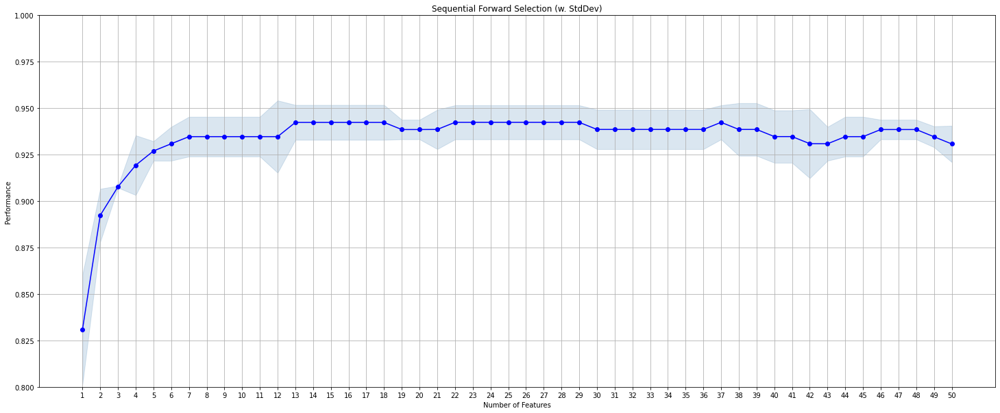

In [104]:
from mlxtend.plotting import plot_sequential_feature_selection as plot_sfs
import matplotlib.pyplot as plt
fig1 = plot_sfs(sfs2.get_metric_dict(), kind='std_dev',figsize=(25,10))

plt.ylim([0.8, 1])
plt.title('Sequential Forward Selection (w. StdDev)')
plt.grid()
plt.show()

In [202]:
# sbs2.subsets_ # shows each k_feature and score
# sbs2.k_feature_idx_  # Shows feature index
# sfs2.k_feature_names_  # Shows best features selected

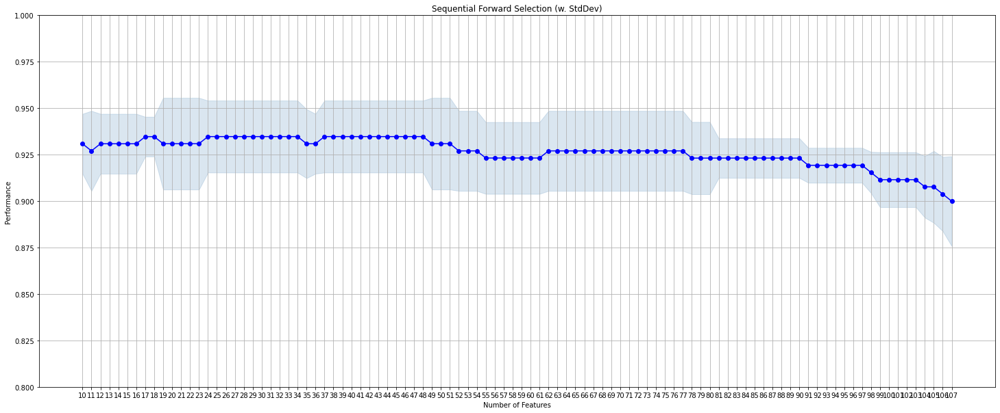

In [105]:
from mlxtend.plotting import plot_sequential_feature_selection as plot_sfs
import matplotlib.pyplot as plt


# fig1=plt.figure(figsize=(20,8), dpi= 100, facecolor='w', edgecolor='k')
plot_sfs(sbs2.get_metric_dict(), kind='std_dev',figsize=(25,10))

plt.ylim([0.8, 1])
plt.title('Sequential Forward Selection (w. StdDev)')
plt.grid()
plt.show()


##### 03 - SMOTEENN Results

In [108]:
from sklearn.neighbors import KNeighborsClassifier
from mlxtend.feature_selection import SequentialFeatureSelector as sfs

X = X_train3
y = y_train3
knn = KNeighborsClassifier(n_neighbors=4)


# Sequential Forward Selection
sfs3 = sfs(knn, 
          k_features=50, 
          forward=True, 
          floating=False, 
          scoring='accuracy',
          cv=3,
          n_jobs=-1)
sfs3 = sfs3.fit(X, y)

print('\nSequential Forward Selection (k=3):')
print(sfs4.k_feature_idx_)
print('CV Score:')
print(sfs4.k_score_)

###################################################

# Sequential Backward Selection
sbs3 = sfs(knn, 
          k_features=10, 
          forward=False, 
          floating=False, 
          scoring='accuracy',
          cv=3,
          n_jobs=-1)
sbs3 = sbs3.fit(X, y)

print('\nSequential Backward Selection (k=3):')
print(sbs3.k_feature_idx_)
print('CV Score:')
print(sbs3.k_score_)

###################################################

# sfs4.subsets_ # shows each k_feature and score
# sfs4.k_feature_idx_  # Shows feature index
# sfs4.k_feature_names_  # Shows best features selected


# sbs3.subsets_ # shows each k_feature and score
# sbs3.k_feature_idx_  # Shows feature index
# sbs3.k_feature_names_  # Shows best features selected


Sequential Forward Selection (k=3):
(0, 1, 2, 3, 4, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 26, 27, 38, 39, 40, 41, 42, 43, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 67, 68, 70, 72, 73, 74, 76, 81, 84, 101)
CV Score:
0.9634069000507357

Sequential Backward Selection (k=3):
(3, 5, 17, 22, 41, 53, 55, 71, 86, 101)
CV Score:
0.958777270421106


In [110]:
pd.DataFrame.from_dict(sfs3.get_metric_dict()).T

,feature_idx,cv_scores,avg_score,feature_names,ci_bound,std_dev,std_err
1,"(39,)","[0.8356164383561644, 0.863013698630137, 0.9027...",0.867136,"(fa1155,)",0.062048,0.027573,0.019497
2,"(39, 56)","[0.9041095890410958, 0.9315068493150684, 0.944...",0.926687,"(fa1155, fa1887)",0.037841,0.016816,0.01189
3,"(39, 56, 84)","[0.9041095890410958, 0.9726027397260274, 0.958...",0.945015,"(fa1155, fa1887, fa4237)",0.066397,0.029505,0.020864
4,"(26, 39, 56, 84)","[0.9041095890410958, 0.9726027397260274, 0.972...",0.949645,"(fa793, fa1155, fa1887, fa4237)",0.072458,0.032199,0.022768
5,"(26, 39, 43, 56, 84)","[0.9315068493150684, 0.958904109589041, 0.9861...",0.958841,"(fa793, fa1155, fa1296, fa1887, fa4237)",0.050165,0.022292,0.015763
6,"(26, 27, 39, 43, 56, 84)","[0.9315068493150684, 0.958904109589041, 0.9861...",0.958841,"(fa793, fa816, fa1155, fa1296, fa1887, fa4237)",0.050165,0.022292,0.015763
7,"(26, 27, 39, 43, 56, 72, 84)","[0.9041095890410958, 0.9726027397260274, 0.986...",0.954274,"(fa793, fa816, fa1155, fa1296, fa1887, fa2996,...",0.080782,0.035898,0.025384
8,"(26, 27, 39, 43, 56, 72, 84, 101)","[0.9178082191780822, 0.9863013698630136, 0.986...",0.963407,"(fa793, fa816, fa1155, fa1296, fa1887, fa2996,...",0.072558,0.032243,0.022799
9,"(26, 27, 39, 43, 56, 67, 72, 84, 101)","[0.9178082191780822, 0.9863013698630136, 0.986...",0.963407,"(fa793, fa816, fa1155, fa1296, fa1887, fa2593,...",0.072558,0.032243,0.022799
10,"(0, 26, 27, 39, 43, 56, 67, 72, 84, 101)","[0.9178082191780822, 0.9863013698630136, 0.986...",0.963407,"(fa226, fa793, fa816, fa1155, fa1296, fa1887, ...",0.072558,0.032243,0.022799


In [111]:
pd.DataFrame.from_dict(sbs3.get_metric_dict()).T

,feature_idx,cv_scores,avg_score,feature_names,ci_bound,std_dev,std_err
107,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[0.8904109589041096, 0.9041095890410958, 0.944...",0.912988,"(fa226, fa257, fa280, fa297, fa324, fa343, fa3...",0.051612,0.022935,0.016218
106,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[0.8904109589041096, 0.9041095890410958, 0.958...",0.917618,"(fa226, fa257, fa280, fa297, fa324, fa343, fa3...",0.065998,0.029328,0.020738
105,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[0.8904109589041096, 0.9178082191780822, 0.958...",0.922184,"(fa226, fa257, fa280, fa297, fa324, fa343, fa3...",0.062787,0.027901,0.019729
104,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[0.8904109589041096, 0.9178082191780822, 0.958...",0.922184,"(fa226, fa257, fa280, fa297, fa324, fa343, fa3...",0.062787,0.027901,0.019729
103,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[0.8904109589041096, 0.9178082191780822, 0.958...",0.922184,"(fa226, fa257, fa280, fa297, fa324, fa343, fa3...",0.062787,0.027901,0.019729
...,...,...,...,...,...,...,...
14,"(3, 5, 6, 8, 9, 17, 22, 41, 53, 55, 56, 71, 86...","[0.9178082191780822, 0.9726027397260274, 0.972...",0.954211,"(fa297, fa343, fa363, fa408, fa432, fa594, fa7...",0.057926,0.025741,0.018202
13,"(3, 5, 6, 8, 17, 22, 41, 53, 55, 56, 71, 86, 101)","[0.9178082191780822, 0.9726027397260274, 0.972...",0.954211,"(fa297, fa343, fa363, fa408, fa594, fa707, fa1...",0.057926,0.025741,0.018202
12,"(3, 5, 6, 17, 22, 41, 53, 55, 56, 71, 86, 101)","[0.9178082191780822, 0.9863013698630136, 0.972...",0.958777,"(fa297, fa343, fa363, fa594, fa707, fa1224, fa...",0.066462,0.029534,0.020884
11,"(3, 5, 17, 22, 41, 53, 55, 56, 71, 86, 101)","[0.9178082191780822, 0.9863013698630136, 0.972...",0.958777,"(fa297, fa343, fa594, fa707, fa1224, fa1731, f...",0.066462,0.029534,0.020884


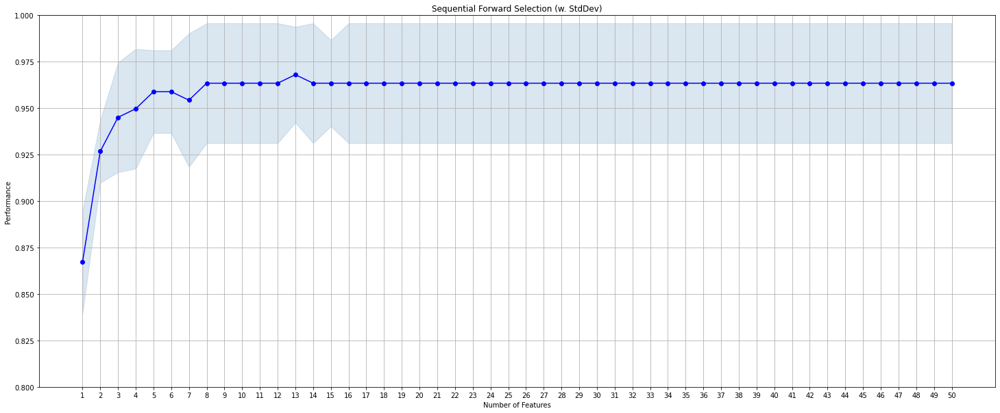

In [112]:
from mlxtend.plotting import plot_sequential_feature_selection as plot_sfs
import matplotlib.pyplot as plt
fig1 = plot_sfs(sfs3.get_metric_dict(), kind='std_dev',figsize=(25,10))

plt.ylim([0.8, 1])
plt.title('Sequential Forward Selection (w. StdDev)')
plt.grid()
plt.show()

In [78]:
# sbs.subsets_ # shows each k_feature and score
# sbs.k_feature_idx_  # Shows feature index
# sbs.k_feature_names_  # Shows best features selected

('fa594',
 'fa667',
 'fa686',
 'fa1224',
 'fa1296',
 'fa1455',
 'fa1633',
 'fa1834',
 'fa2244',
 'fa6535')

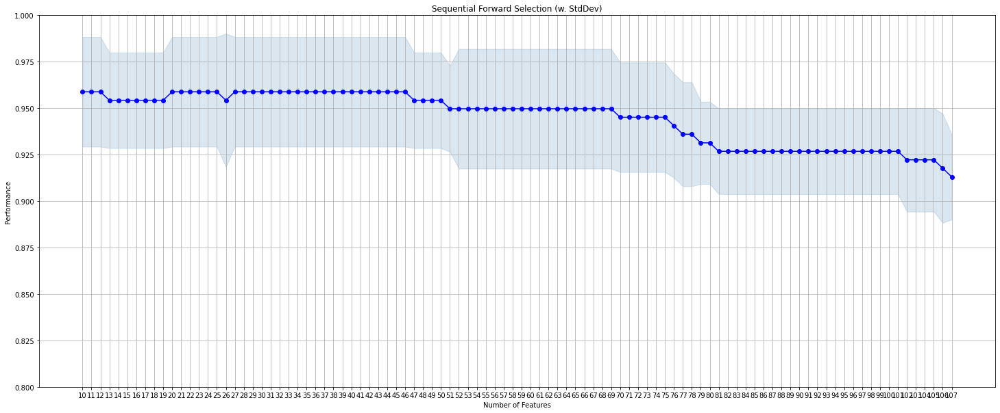

In [113]:
from mlxtend.plotting import plot_sequential_feature_selection as plot_sfs
import matplotlib.pyplot as plt


# fig1=plt.figure(figsize=(20,8), dpi= 100, facecolor='w', edgecolor='k')
plot_sfs(sbs3.get_metric_dict(), kind='std_dev',figsize=(25,10))

plt.ylim([0.8, 1])
plt.title('Sequential Forward Selection (w. StdDev)')
plt.grid()
plt.show()


##### 04 - SMOTETomek Results

In [109]:
from sklearn.neighbors import KNeighborsClassifier
from mlxtend.feature_selection import SequentialFeatureSelector as sfs

X = X_train4
y = y_train4
knn = KNeighborsClassifier(n_neighbors=4)


# Sequential Forward Selection
sfs4 = sfs(knn, 
          k_features=50, 
          forward=True, 
          floating=False, 
          scoring='accuracy',
          cv=3,
          n_jobs=-1)
sfs4 = sfs4.fit(X, y)

print('\nSequential Forward Selection (k=3):')
print(sfs4.k_feature_idx_)
print('CV Score:')
print(sfs4.k_score_)

###################################################

# Sequential Backward Selection
sbs4 = sfs(knn, 
          k_features=10, 
          forward=False, 
          floating=False, 
          scoring='accuracy',
          cv=3,
          n_jobs=-1)
sbs4 = sbs4.fit(X, y)

print('\nSequential Backward Selection (k=3):')
print(sbs4.k_feature_idx_)
print('CV Score:')
print(sbs4.k_score_)

###################################################

# sfs4.subsets_ # shows each k_feature and score
# sfs4.k_feature_idx_  # Shows feature index
# sfs4.k_feature_names_  # Shows best features selected


# sbs4.subsets_ # shows each k_feature and score
# sbs4.k_feature_idx_  # Shows feature index
# sbs4.k_feature_names_  # Shows best features selected


Sequential Forward Selection (k=3):
(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 19, 21, 23, 24, 25, 26, 28, 29, 30, 31, 32, 34, 35, 36, 37, 46, 49, 50, 56, 57, 62, 66, 71, 79, 80, 82, 97, 100, 102, 103, 104, 105)
CV Score:
0.9410364145658264

Sequential Backward Selection (k=3):
(4, 9, 17, 18, 19, 43, 59, 74, 82, 91)
CV Score:
0.9409897292250232


In [114]:
pd.DataFrame.from_dict(sfs4.get_metric_dict()).T

,feature_idx,cv_scores,avg_score,feature_names,ci_bound,std_dev,std_err
1,"(35,)","[0.8352941176470589, 0.8117647058823529, 0.892...",0.846639,"(fa1029,)",0.076655,0.034064,0.024087
2,"(35, 103)","[0.8941176470588236, 0.9058823529411765, 0.916...",0.905556,"(fa1029, fa7336)",0.020722,0.009208,0.006511
3,"(19, 35, 103)","[0.9058823529411765, 0.8941176470588236, 0.928...",0.909524,"(fa648, fa1029, fa7336)",0.032178,0.014299,0.010111
4,"(19, 35, 62, 103)","[0.8941176470588236, 0.9294117647058824, 0.952...",0.925303,"(fa648, fa1029, fa2244, fa7336)",0.053924,0.023963,0.016944
5,"(19, 31, 35, 62, 103)","[0.9176470588235294, 0.9294117647058824, 0.952...",0.933147,"(fa648, fa917, fa1029, fa2244, fa7336)",0.032458,0.014424,0.010199
6,"(1, 19, 31, 35, 62, 103)","[0.9058823529411765, 0.9294117647058824, 0.952...",0.929225,"(fa257, fa648, fa917, fa1029, fa2244, fa7336)",0.042719,0.018983,0.013423
7,"(1, 19, 31, 35, 36, 62, 103)","[0.9058823529411765, 0.9294117647058824, 0.952...",0.929225,"(fa257, fa648, fa917, fa1029, fa1059, fa2244, ...",0.042719,0.018983,0.013423
8,"(1, 19, 31, 35, 36, 49, 62, 103)","[0.9294117647058824, 0.9294117647058824, 0.940...",0.9331,"(fa257, fa648, fa917, fa1029, fa1059, fa1542, ...",0.011737,0.005216,0.003688
9,"(1, 2, 19, 31, 35, 36, 49, 62, 103)","[0.9294117647058824, 0.9294117647058824, 0.940...",0.9331,"(fa257, fa280, fa648, fa917, fa1029, fa1059, f...",0.011737,0.005216,0.003688
10,"(1, 2, 3, 19, 31, 35, 36, 49, 62, 103)","[0.9294117647058824, 0.9294117647058824, 0.940...",0.9331,"(fa257, fa280, fa297, fa648, fa917, fa1029, fa...",0.011737,0.005216,0.003688


In [115]:
pd.DataFrame.from_dict(sbs4.get_metric_dict()).T

,feature_idx,cv_scores,avg_score,feature_names,ci_bound,std_dev,std_err
107,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[0.9058823529411765, 0.9294117647058824, 0.880...",0.905415,"(fa226, fa257, fa280, fa297, fa324, fa343, fa3...",0.044525,0.019786,0.013991
106,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[0.9176470588235294, 0.9294117647058824, 0.892...",0.913305,"(fa226, fa257, fa280, fa297, fa324, fa343, fa3...",0.034286,0.015236,0.010773
105,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[0.9176470588235294, 0.9294117647058824, 0.904...",0.917274,"(fa226, fa257, fa280, fa297, fa324, fa343, fa3...",0.022653,0.010067,0.007118
104,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[0.9058823529411765, 0.9294117647058824, 0.916...",0.91732,"(fa226, fa257, fa280, fa297, fa324, fa343, fa3...",0.021641,0.009617,0.0068
103,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[0.9176470588235294, 0.9294117647058824, 0.916...",0.921242,"(fa226, fa257, fa280, fa297, fa324, fa343, fa3...",0.013031,0.005791,0.004095
...,...,...,...,...,...,...,...
14,"(4, 9, 17, 18, 19, 26, 31, 43, 59, 70, 74, 82,...","[0.9294117647058824, 0.9176470588235294, 0.964...",0.937115,"(fa324, fa432, fa594, fa629, fa648, fa793, fa9...",0.044565,0.019804,0.014004
13,"(4, 9, 17, 18, 19, 26, 31, 43, 59, 74, 82, 91,...","[0.9294117647058824, 0.9176470588235294, 0.964...",0.937115,"(fa324, fa432, fa594, fa629, fa648, fa793, fa9...",0.044565,0.019804,0.014004
12,"(4, 9, 17, 18, 19, 31, 43, 59, 74, 82, 91, 100)","[0.9294117647058824, 0.9176470588235294, 0.964...",0.937115,"(fa324, fa432, fa594, fa629, fa648, fa917, fa1...",0.044565,0.019804,0.014004
11,"(4, 9, 17, 18, 19, 31, 43, 59, 74, 82, 91)","[0.9411764705882353, 0.9294117647058824, 0.952...",0.94099,"(fa324, fa432, fa594, fa629, fa648, fa917, fa1...",0.021104,0.009378,0.006631


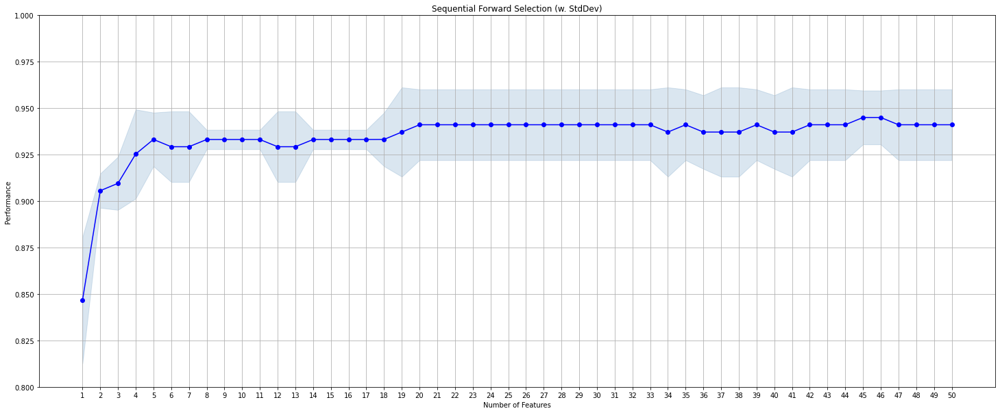

In [116]:
from mlxtend.plotting import plot_sequential_feature_selection as plot_sfs
import matplotlib.pyplot as plt
fig1 = plot_sfs(sfs4.get_metric_dict(), kind='std_dev',figsize=(25,10))

plt.ylim([0.8, 1])
plt.title('Sequential Forward Selection (w. StdDev)')
plt.grid()
plt.show()

In [78]:
# sbs.subsets_ # shows each k_feature and score
# sbs.k_feature_idx_  # Shows feature index
# sbs.k_feature_names_  # Shows best features selected

('fa594',
 'fa667',
 'fa686',
 'fa1224',
 'fa1296',
 'fa1455',
 'fa1633',
 'fa1834',
 'fa2244',
 'fa6535')

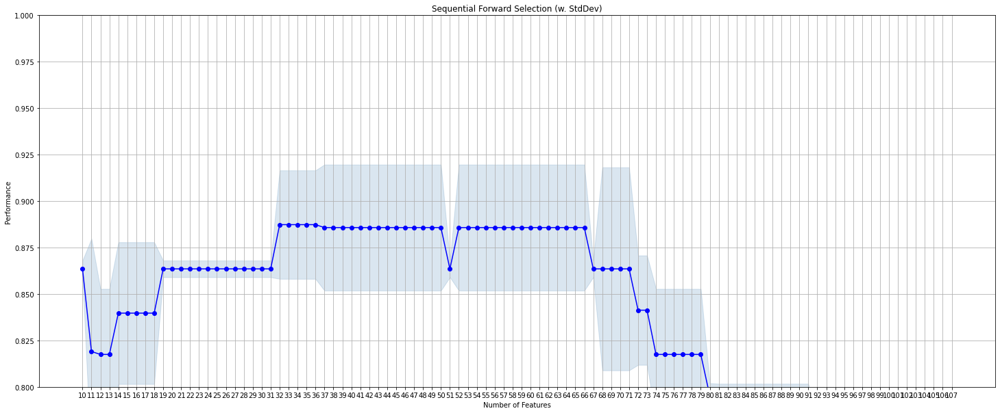

In [117]:
from mlxtend.plotting import plot_sequential_feature_selection as plot_sfs
import matplotlib.pyplot as plt


# fig1=plt.figure(figsize=(20,8), dpi= 100, facecolor='w', edgecolor='k')
plot_sfs(sbs.get_metric_dict(), kind='std_dev',figsize=(25,10))

plt.ylim([0.8, 1])
plt.title('Sequential Forward Selection (w. StdDev)')
plt.grid()
plt.show()


#### 04 - K-Best

##### 01 - Nearmiss Results

##### 02 - SMOTE Results

##### 03 - SMOTEENN Results

##### 04 - SMOTETomek Results

### 03 - Embedded Methods

#### 01 - Lasso

##### 01 - Nearmiss Results

##### 02 - SMOTE Results

##### 03 - SMOTEENN Results

##### 04 - SMOTETomek Results

## 5.0 - Dimensional Reduction Methods

## 6.0 - Classification model

### 01 - Hyperparameter tuning

## 7.0 - Model Explainability

## 8.0 - Conclusions

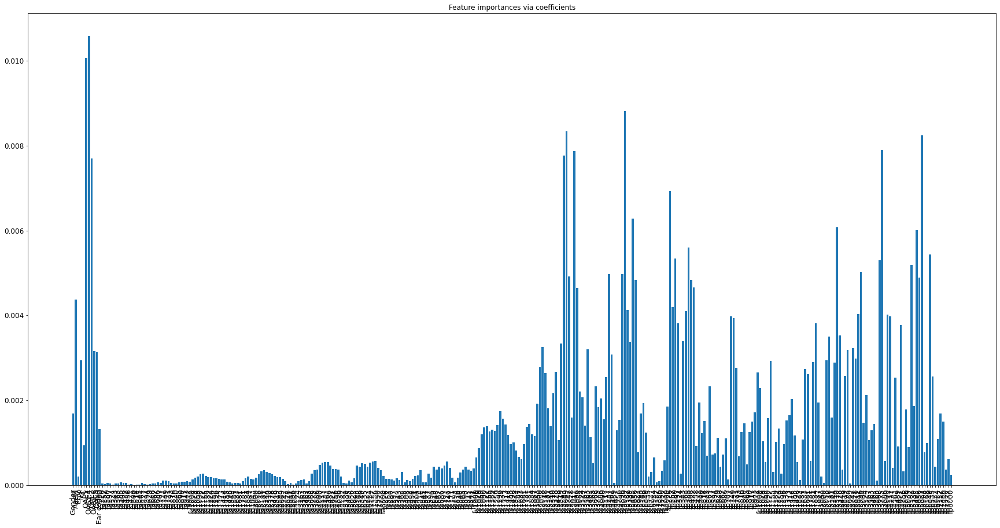

In [166]:
plt.figure(figsize=(30, 15))
import matplotlib.pyplot as plt
import numpy as np
from sklearn.linear_model import RidgeCV

ridge = RidgeCV(alphas=np.logspace(-6, 6, num=5)).fit(X_train, y_train)
importance = np.abs(ridge.coef_)
feature_names = np.array(X_train.columns)
index = np.array(range(1,321))
plt.bar(height=importance[0], x=feature_names)
plt.xticks(rotation=90)
plt.title("Feature importances via coefficients")
plt.show()

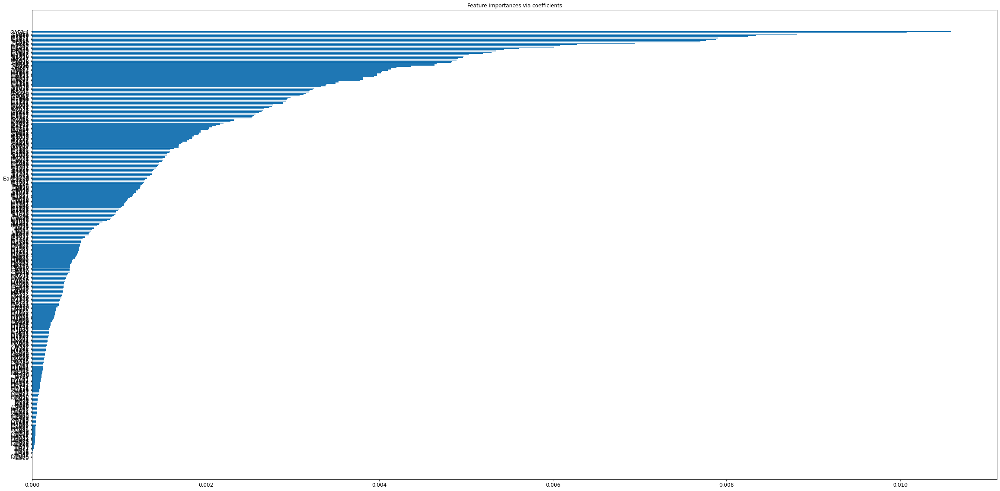

In [156]:
plt.figure(figsize=(40, 20))
import matplotlib.pyplot as plt
import numpy as np
from sklearn.linear_model import RidgeCV

ridge = RidgeCV(alphas=np.logspace(-6, 6, num=5)).fit(X_train, y_train)
importance = np.abs(ridge.coef_)
feature_names = np.array(X_train.columns)
df=pd.DataFrame({
    'Feature':feature_names,
    'Importance':importance[0]
})
df=df.sort_values(by=['Importance'])
plt.barh(width=df.Importance, y=df.Feature)
plt.title("Feature importances via coefficients")
plt.show()

In [158]:
df.tail(20)

,Feature,Importance
207,fy4896,0.004970
297,fp2996,0.005029
316,fp5187,0.005193
304,fp3668,0.005292
227,fp280,0.005344
323,fp6349,0.005437
232,fp385,0.005605
318,fp5495,0.006011
288,fp2310,0.006081
211,fy5495,0.006280


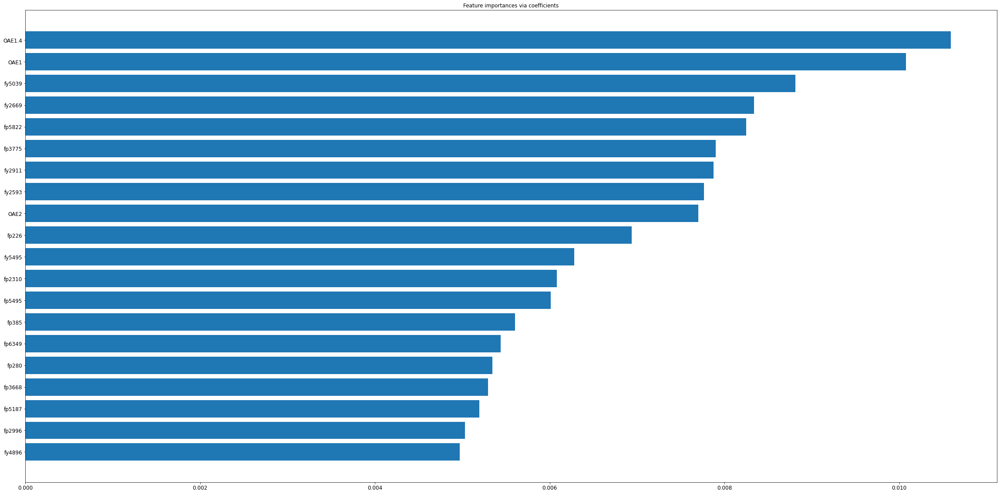

In [160]:
plt.figure(figsize=(40, 20))
import matplotlib.pyplot as plt
import numpy as np
from sklearn.linear_model import RidgeCV

ridge = RidgeCV(alphas=np.logspace(-6, 6, num=5)).fit(X_train, y_train)
importance = np.abs(ridge.coef_)
feature_names = np.array(X_train.columns)
df=pd.DataFrame({
    'Feature':feature_names,
    'Importance':importance[0]
})
df=df.sort_values(by=['Importance'])
df=df.tail(20)
plt.barh(width=df.Importance, y=df.Feature)
plt.title("Feature importances via coefficients")
plt.show()

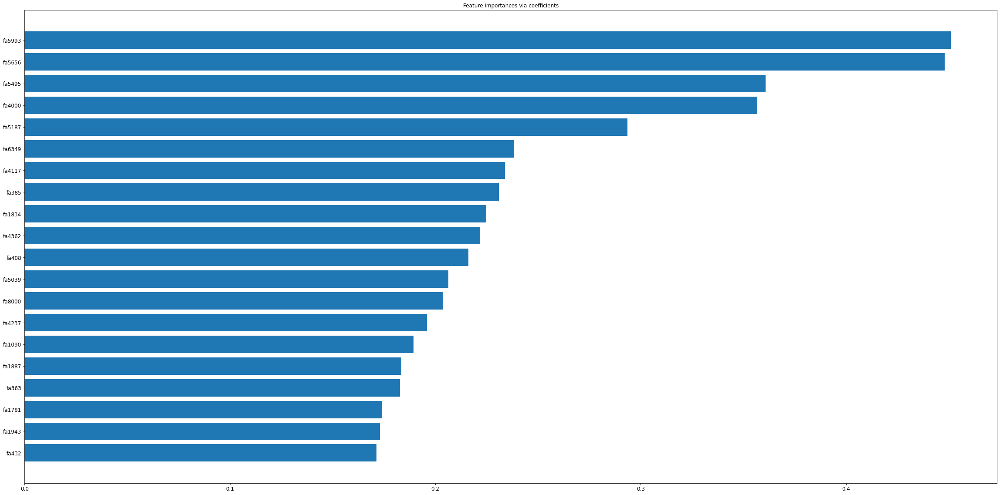

In [161]:
plt.figure(figsize=(40, 20))
import matplotlib.pyplot as plt
import numpy as np
from sklearn.linear_model import RidgeCV

x= X_train.filter(regex='fa.*')

ridge = RidgeCV(alphas=np.logspace(-6, 6, num=5)).fit(x, y_train)
importance = np.abs(ridge.coef_)
feature_names = np.array(x.columns)
df=pd.DataFrame({
    'Feature':feature_names,
    'Importance':importance[0]
})
df=df.sort_values(by=['Importance'])
df=df.tail(20)
plt.barh(width=df.Importance, y=df.Feature)
plt.title("Feature importances via coefficients")
plt.show()

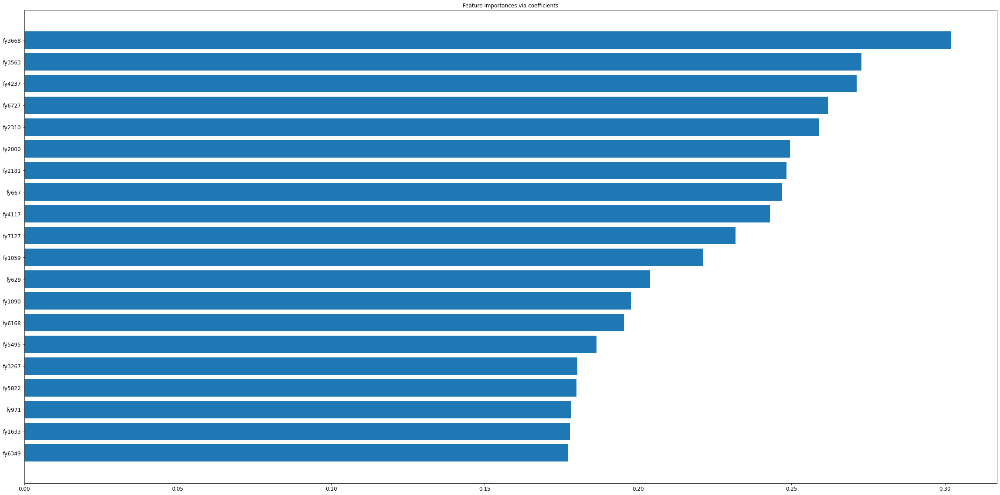

In [164]:
plt.figure(figsize=(40, 20))
import matplotlib.pyplot as plt
import numpy as np
from sklearn.linear_model import RidgeCV

x= X_train.filter(regex='fy.*')

ridge = RidgeCV(alphas=np.logspace(-6, 6, num=5)).fit(x, y_train)
importance = np.abs(ridge.coef_)
feature_names = np.array(x.columns)
df=pd.DataFrame({
    'Feature':feature_names,
    'Importance':importance[0]
})
df=df.sort_values(by=['Importance'])
df=df.tail(20)
plt.barh(width=df.Importance, y=df.Feature)
plt.title("Feature importances via coefficients")
plt.show()

In [23]:
X_train4=X_train4.filter(regex='fa',axis=1)
X_test4=X_test4.filter(regex='fa',axis=1)

In [22]:
train_dat=pd.concat([X_train,y_train],axis=1)

In [50]:
corr_matrx=X_train.corr().abs()
corr_matrx

,Gender,AgeM,ECV,TPP,SC,OAE1,OAE1.4,OAE2,OAE2.8,OAE4,...,fp6168,fp6349,fp6535,fp6727,fp6924,fp7127,fp7336,fp7550,fp7772,fp8000
Gender,1.000000,0.186462,0.145709,0.107319,0.085825,0.202004,0.055075,0.029440,0.187111,0.191303,...,0.010510,0.011775,0.053207,0.056868,0.083748,0.100851,0.107980,0.059048,0.078378,0.045177
AgeM,0.186462,1.000000,0.028207,0.002384,0.061608,0.099532,0.186941,0.189811,0.001375,0.094269,...,0.131673,0.136928,0.095249,0.079986,0.036170,0.010933,0.042907,0.100659,0.145611,0.142132
ECV,0.145709,0.028207,1.000000,0.096901,0.117546,0.028560,0.058964,0.037869,0.008227,0.115408,...,0.165544,0.145095,0.078961,0.047761,0.030605,0.008182,0.007536,0.043200,0.076775,0.074483
TPP,0.107319,0.002384,0.096901,1.000000,0.308024,0.428255,0.320785,0.162402,0.327890,0.050200,...,0.064716,0.088745,0.116665,0.158453,0.156161,0.100873,0.105247,0.048394,0.135234,0.195725
SC,0.085825,0.061608,0.117546,0.308024,1.000000,0.087982,0.220678,0.203832,0.117765,0.046838,...,0.109567,0.115927,0.042139,0.000737,0.012315,0.005522,0.041054,0.091279,0.052795,0.019938
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
fp7127,0.100851,0.010933,0.008182,0.100873,0.005522,0.169330,0.053567,0.100407,0.060390,0.133638,...,0.471234,0.521471,0.714958,0.830001,0.930169,1.000000,0.912121,0.802751,0.646107,0.469188
fp7336,0.107980,0.042907,0.007536,0.105247,0.041054,0.161196,0.096740,0.146528,0.094932,0.134825,...,0.391129,0.435243,0.603697,0.708702,0.805611,0.912121,1.000000,0.914742,0.747235,0.553407
fp7550,0.059048,0.100659,0.043200,0.048394,0.091279,0.163186,0.090293,0.125729,0.130557,0.131933,...,0.315338,0.356531,0.504402,0.599629,0.691957,0.802751,0.914742,1.000000,0.852788,0.650935
fp7772,0.078378,0.145611,0.076775,0.135234,0.052795,0.104567,0.051767,0.065828,0.073139,0.139693,...,0.231446,0.269322,0.394205,0.473873,0.552572,0.646107,0.747235,0.852788,1.000000,0.874272


In [54]:
# plt.figure(figsize=(20, 20))
# corr = train_dat.corr()
# ax = sb.heatmap(
#     corr, 
#     vmin=-1, vmax=1, center=0,
#     cmap=sb.diverging_palette(20, 220, n=200),
#     square=False
# )
# # ax.set_xticklabels(
# #     ax.get_xticklabels(),
# #     rotation=45,
# #     horizontalalignment='right'
# # );

In [59]:
pipeline = Pipeline([
    ('min_max_scaler', MinMaxScaler()),
    ('std_scaler', StandardScaler())
])

X_train = pipeline.fit_transform(X_train)
X_test = pipeline.transform(X_test)

In [76]:
from sklearn.svm import SVC
model = SVC(kernel='linear')
model.fit(X_train, y_train)

print_score(model, X_train, y_train, X_test, y_test, train=True)
print_score(model, X_train, y_train, X_test, y_test, train=False)

Train Result:
Accuracy Score: 100.00%
_______________________________________________
CLASSIFICATION REPORT:
               0      1  accuracy  macro avg  weighted avg
precision    1.0    1.0       1.0        1.0           1.0
recall       1.0    1.0       1.0        1.0           1.0
f1-score     1.0    1.0       1.0        1.0           1.0
support    160.0  160.0       1.0      320.0         320.0
_______________________________________________
Confusion Matrix: 
 [[160   0]
 [  0 160]]

Test Result:
Accuracy Score: 95.83%
_______________________________________________
CLASSIFICATION REPORT:
                  0         1  accuracy  macro avg  weighted avg
precision   1.00000  0.777778  0.958333   0.888889      0.967593
recall      0.95122  1.000000  0.958333   0.975610      0.958333
f1-score    0.97500  0.875000  0.958333   0.925000      0.960417
support    41.00000  7.000000  0.958333  48.000000     48.000000
_______________________________________________
Confusion Matrix: 
 [[39

In [74]:
print("=======================Polynomial Kernel SVM==========================")
from sklearn.svm import SVC

model = SVC(kernel='poly', degree=2, gamma='auto')
model.fit(X_train, y_train)

print_score(model, X_train, y_train, X_test, y_test, train=True)
print_score(model, X_train, y_train, X_test, y_test, train=False)

=======================Polynomial Kernel SVM==========================
Train Result:
Accuracy Score: 95.31%
_______________________________________________
CLASSIFICATION REPORT:
                    0           1  accuracy   macro avg  weighted avg
precision    0.939394    0.967742  0.953125    0.953568      0.953568
recall       0.968750    0.937500  0.953125    0.953125      0.953125
f1-score     0.953846    0.952381  0.953125    0.953114      0.953114
support    160.000000  160.000000  0.953125  320.000000    320.000000
_______________________________________________
Confusion Matrix: 
 [[155   5]
 [ 10 150]]

Test Result:
Accuracy Score: 81.25%
_______________________________________________
CLASSIFICATION REPORT:
                   0         1  accuracy  macro avg  weighted avg
precision   0.944444  0.416667    0.8125   0.680556      0.867477
recall      0.829268  0.714286    0.8125   0.771777      0.812500
f1-score    0.883117  0.526316    0.8125   0.704716      0.831083
support 

In [75]:
print("=======================Radial Kernel SVM==========================")
from sklearn.svm import SVC

model = SVC(kernel='rbf', gamma=1)
model.fit(X_train, y_train)

print_score(model, X_train, y_train, X_test, y_test, train=True)
print_score(model, X_train, y_train, X_test, y_test, train=False)

=======================Radial Kernel SVM==========================
Train Result:
Accuracy Score: 100.00%
_______________________________________________
CLASSIFICATION REPORT:
               0      1  accuracy  macro avg  weighted avg
precision    1.0    1.0       1.0        1.0           1.0
recall       1.0    1.0       1.0        1.0           1.0
f1-score     1.0    1.0       1.0        1.0           1.0
support    160.0  160.0       1.0      320.0         320.0
_______________________________________________
Confusion Matrix: 
 [[160   0]
 [  0 160]]

Test Result:
Accuracy Score: 85.42%
_______________________________________________
CLASSIFICATION REPORT:
                   0    1  accuracy  macro avg  weighted avg
precision   0.854167  0.0  0.854167   0.427083      0.729601
recall      1.000000  0.0  0.854167   0.500000      0.854167
f1-score    0.921348  0.0  0.854167   0.460674      0.786985
support    41.000000  7.0  0.854167  48.000000     48.000000
_________________________

## Hyperparameter tuning

In [80]:
from sklearn.model_selection import GridSearchCV

param_grid = {'C': [0.01, 0.1, 0.5, 1, 10, 100], 
              'gamma': [1, 0.75, 0.5, 0.25, 0.1, 0.01, 0.001], 
              'kernel': ['rbf', 'poly', 'linear']} 

grid = GridSearchCV(SVC(), param_grid, refit=True, verbose=1, cv=5)
grid.fit(X_train, y_train)

best_params = grid.best_params_
print(f"Best params: {best_params}")

svm_clf = SVC(**best_params)
svm_clf.fit(X_train, y_train)
print_score(svm_clf, X_train, y_train, X_test, y_test, train=True)
print_score(svm_clf, X_train, y_train, X_test, y_test, train=False)

Fitting 5 folds for each of 126 candidates, totalling 630 fits
Best params: {'C': 10, 'gamma': 0.01, 'kernel': 'rbf'}
Train Result:
Accuracy Score: 100.00%
_______________________________________________
CLASSIFICATION REPORT:
               0      1  accuracy  macro avg  weighted avg
precision    1.0    1.0       1.0        1.0           1.0
recall       1.0    1.0       1.0        1.0           1.0
f1-score     1.0    1.0       1.0        1.0           1.0
support    160.0  160.0       1.0      320.0         320.0
_______________________________________________
Confusion Matrix: 
 [[160   0]
 [  0 160]]

Test Result:
Accuracy Score: 95.83%
_______________________________________________
CLASSIFICATION REPORT:
                   0         1  accuracy  macro avg  weighted avg
precision   0.953488  1.000000  0.958333   0.976744      0.960271
recall      1.000000  0.714286  0.958333   0.857143      0.958333
f1-score    0.976190  0.833333  0.958333   0.904762      0.955357
support    41.0

## Archived

## Functions

In [8]:
def sliding_window(df,window,counter):
    test_freqs=df.filter(regex=("f.*"))
    feature_idx_end=df.columns.get_loc("Ear.coded")+1
    features=df.iloc[:,:feature_idx_end]
    window_start=window*(counter-1)
    window_end=window*(counter)
    select_freq=test_freqs.iloc[:,window_start:window_end]
    data_window=pd.concat([features,select_freq],axis=1)
    return data_window

def split(data):
    y=data.loc[:,"OverallPoF"]
    X=data.drop(["OverallPoF"],axis=1)
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20,random_state=20)
    return X_train,X_test,y_train,y_test

def split_window(data,window,counter):
    X_train=split(sliding_window(data,window,counter))[0]
    Y_train=split(sliding_window(data,window,counter))[2]
    x_test=split(sliding_window(data,window,counter))[1]
    y_test=split(sliding_window(data,window,counter))[3]
    return X_train,x_test,Y_train,y_test

def mix_sort(string):
    return list(map(int,re.findall(r'\d+',string)))[0]

## Loading data set

In [9]:
a_data=pd.read_csv("a_data.csv")
a_data.head()

,Gender,AgeM,ECV,TPP,SC,TympPoF,OAE1,OAE1.4,OAE2,OAE2.8,...,f6168,f6349,f6535,f6727,f6924,f7127,f7336,f7550,f7772,f8000
0,0,112,1.08,0,0.52,1,3.0,10.0,18.0,14.0,...,0.5370,0.4869,0.4301,0.4080,0.3804,0.3291,0.2951,0.2530,0.2282,0.2003
1,0,114,1.28,0,1.28,0,7.0,4.0,9.0,5.0,...,0.2636,0.2578,0.2443,0.2549,0.2604,0.2397,0.2299,0.2048,0.1917,0.1659
2,1,118,1.26,0,0.87,0,9.0,12.0,8.0,12.0,...,0.4269,0.4142,0.3910,0.3799,0.3740,0.3536,0.3473,0.3237,0.3056,0.2881
3,0,119,0.64,0,0.60,0,13.0,9.0,13.0,11.0,...,0.0077,0.0123,0.0066,0.0000,0.0126,0.0231,0.0405,0.0401,0.0391,0.0258
4,0,95,0.92,0,1.65,0,7.0,0.0,2.0,12.0,...,0.2332,0.2216,0.2228,0.2653,0.2596,0.2576,0.2838,0.3598,0.3953,0.3642


## Splitting Training and Testing Set

In [10]:
## Left = 0 Right = 1

In [11]:
# col_exclusion=["OAEPoF","TympPoF"] ## Determined that Gender SC and ECV take up too much variance
col_exclusion=["OAEPoF","TympPoF","Gender","ECV","SC"]

In [12]:
data=a_data.drop(col_exclusion,axis=1)
# data.columns.values.tolist()

In [13]:
y=data.loc[:,"OverallPoF"]
X=data.drop(["OverallPoF"],axis=1)

In [14]:
from sklearn.model_selection import train_test_split
X_train, x_test, Y_train, y_test = train_test_split(X, y, test_size = 0.20,random_state=12)
# X_train.columns.values.tolist()

In [15]:
X_train

,AgeM,TPP,OAE1,OAE1.4,OAE2,OAE2.8,OAE4,Ear.coded,f226,f257,...,f6168,f6349,f6535,f6727,f6924,f7127,f7336,f7550,f7772,f8000
216,97,0,7.5,9.7,8.3,9.5,13.3,1,0.0575,0.0933,...,0.0328,0.0374,0.0126,0.0112,0.0307,0.0162,0.0208,0.0144,0.0337,0.0217
36,121,8,16.0,11.0,16.0,8.0,3.0,0,0.0612,0.1023,...,0.1940,0.2110,0.2030,0.2176,0.2472,0.2470,0.2682,0.2718,0.3107,0.3356
1,114,0,7.0,4.0,9.0,5.0,6.0,0,0.1114,0.1501,...,0.2636,0.2578,0.2443,0.2549,0.2604,0.2397,0.2299,0.2048,0.1917,0.1659
179,117,0,5.7,7.6,0.0,0.4,0.0,1,0.0082,0.0325,...,0.2717,0.2478,0.2058,0.1763,0.1718,0.1403,0.1255,0.0935,0.1069,0.0527
51,105,0,0.0,0.0,0.0,0.0,0.0,0,0.0000,0.0104,...,0.0426,0.0454,0.0011,0.0211,0.0593,0.0151,0.0000,0.0000,0.0000,0.0000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3,119,0,13.0,9.0,13.0,11.0,12.0,0,0.0748,0.0953,...,0.0077,0.0123,0.0066,0.0000,0.0126,0.0231,0.0405,0.0401,0.0391,0.0258
130,103,0,3.0,8.0,17.0,12.0,5.0,1,0.1426,0.1903,...,0.5017,0.4453,0.3836,0.3349,0.3005,0.2659,0.2559,0.2345,0.2119,0.1923
134,103,0,6.0,15.0,9.0,12.0,10.0,1,0.0630,0.0828,...,0.1984,0.1776,0.1440,0.1469,0.1433,0.1191,0.1015,0.0759,0.0688,0.0387
155,121,0,13.0,24.0,18.0,11.0,6.0,1,0.0599,0.1016,...,0.2228,0.2295,0.2087,0.2101,0.2288,0.2213,0.2421,0.2534,0.2857,0.2966


## Resampling methods

In [43]:
fails=sum(data.OverallPoF==1)
fails

38

In [44]:
passes=sum(data.OverallPoF==0)
passes

201

In [45]:
len(X_train.columns.values)

9

## Feature Selection

### Feature selection - Sliding window set size

In [57]:
# We need to exclude gender SC and ECV
from sklearn import svm
window_list=[107]
counter_list=[1]

feat_rank={}

for i, window in enumerate(window_list):

    svm_clf = svm.SVC(kernel='linear')
    counter=counter_list[i]
    for j in range(1,counter+1):
        X_train=split_window(data,window,j)[0]
        # x_test=split_window(data,window,j)[1]
        Y_train=split_window(data,window,j)[2]
        # y_test=split_window(data,window,j)[3]

        svm_clf.fit(X_train, Y_train)
        # ax=pd.Series(abs(svm_clf.coef_[0]), index=X_train.columns).nlargest(10).plot(kind='barh')
        # ax.invert_yaxis()
        rank=pd.Series(abs(svm_clf.coef_[0]), index=X_train.columns).nlargest(115).index
    for i, c in enumerate(rank):
        feat_rank[c]=feat_rank.get(c,0)+i

In [58]:
pd.Series(abs(svm_clf.coef_[0]), index=X_train.columns).nlargest(20).index

Index(['f8000', 'f1731', 'f7772', 'f226', 'f5993', 'f1681', 'f257', 'f4000',
       'f1781', 'Ear.coded', 'f280', 'f3084', 'f2996', 'f7550', 'f1059',
       'f1090', 'f1943', 'f1834', 'f297', 'f4117'],
      dtype='object')

In [59]:
feature_ranking=pd.DataFrame(list(feat_rank.items()),columns=['Frequency','Ranking'])
feature_ranking.sort_values(by=['Ranking']).head(50)
frequency_ranking=feature_ranking[feature_ranking["Frequency"].str.contains("f.")]

In [60]:
rank

Index(['f8000', 'f1731', 'f7772', 'f226', 'f5993', 'f1681', 'f257', 'f4000',
       'f1781', 'Ear.coded',
       ...
       'OAE4', 'TPP', 'f6349', 'f3363', 'f1224', 'f1259', 'OAE2.8', 'f5822',
       'f6535', 'f2669'],
      dtype='object', length=115)

In [61]:
fnew=frequency_ranking.copy()

In [62]:
freq_values=frequency_ranking['Frequency'].apply(lambda string: int(string.replace('f',''))).to_numpy()
fnew["fval"]=freq_values

In [63]:
fnew.sort_values('fval',ascending=True,inplace=True)

### Feature selection - Sliding window set size

In [65]:
split_window(data,20,1)[0]

,AgeM,TPP,OAE1,OAE1.4,OAE2,OAE2.8,OAE4,Ear.coded,f226,f257,...,f458,f471,f500,f514,f545,f561,f577,f594,f629,f648
219,102,0,4.5,13.7,8.6,5.8,7.2,1,0.0348,0.0649,...,0.1361,0.1437,0.1730,0.2092,0.2331,0.2395,0.2361,0.2422,0.2593,0.2828
206,95,0,9.4,9.8,8.1,11.9,9.8,1,0.0111,0.0361,...,0.0634,0.0643,0.0881,0.1209,0.1440,0.1477,0.1446,0.1501,0.1675,0.1927
154,117,0,20.0,20.0,18.0,11.0,14.0,1,0.0804,0.1149,...,0.2213,0.2366,0.2700,0.3167,0.3511,0.3705,0.3779,0.3917,0.4153,0.4446
120,112,0,4.0,7.0,11.0,5.0,8.0,1,0.1036,0.1326,...,0.2209,0.2352,0.2699,0.3089,0.3326,0.3396,0.3364,0.3376,0.3487,0.3657
59,116,0,16.5,24.5,18.5,6.1,6.4,0,0.0480,0.0843,...,0.1759,0.1881,0.2247,0.2702,0.3000,0.3093,0.3096,0.3165,0.3354,0.3588
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
156,100,0,7.0,9.0,17.0,20.0,11.0,1,0.0163,0.0444,...,0.0823,0.0867,0.1191,0.1603,0.1899,0.1969,0.1923,0.1985,0.2212,0.2562
223,99,0,29.2,17.8,16.6,4.8,5.9,1,0.0207,0.0482,...,0.0821,0.0832,0.1136,0.1569,0.1864,0.1934,0.1862,0.1873,0.2088,0.2414
15,102,0,5.0,3.0,3.0,18.0,13.0,0,0.0620,0.0815,...,0.0875,0.0914,0.1174,0.1516,0.1718,0.1719,0.1598,0.1528,0.1613,0.1813
218,97,0,0.0,6.7,9.2,10.0,5.8,1,0.0000,0.0101,...,0.0180,0.0163,0.0327,0.0570,0.0725,0.0734,0.0671,0.0668,0.0777,0.0958


### Feature score - Sliding window multiple size

In [74]:
# We need to exclude gender SC and ECV
from sklearn import svm
window_list=[107,53,26,15,7,4,2,1]
counter_list=[1,2,4,7,15,26,53,107]

feat_rank={}

for i, window in enumerate(window_list):

    svm_clf = svm.SVC(kernel='linear')
    counter=counter_list[i]
    for j in range(1,counter+1):
        X_train=split_window(data,window,j)[0]
        # x_test=split_window(data,window,j)[1]
        Y_train=split_window(data,window,j)[2]
        # y_test=split_window(data,window,j)[3]

        svm_clf.fit(X_train, Y_train)
        # ax=pd.Series(abs(svm_clf.coef_[0]), index=X_train.columns).nlargest(10).plot(kind='barh')
        # ax.invert_yaxis()
        rank=pd.Series(abs(svm_clf.coef_[0]), index=X_train.columns).nlargest(115).index
    for i, c in enumerate(rank):
        feat_rank[c]=feat_rank.get(c,0)+i

In [75]:
feature_ranking=pd.DataFrame(list(feat_rank.items()),columns=['Frequency','Ranking'])
feature_ranking.sort_values(by=['Ranking']).head(50)
frequency_ranking=feature_ranking[feature_ranking["Frequency"].str.contains("f.")]

In [76]:
fnew=frequency_ranking.copy()

In [77]:
freq_values=frequency_ranking['Frequency'].apply(lambda string: int(string.replace('f',''))).to_numpy()
fnew["fval"]=freq_values

In [116]:
fnew.sort_values('fval',ascending=True,inplace=True)
fnew.head(50)

,Frequency,Ranking,fval
3,f226,3,226
6,f257,6,257
10,f280,10,280
18,f297,18,297
33,f324,33,324
54,f343,54,343
74,f363,74,363
80,f385,80,385
76,f408,76,408
64,f432,64,432


In [140]:
max_score=fnew.Ranking.max()
rank=fnew['Ranking'].apply(lambda val: abs(val-max_score)).to_numpy()
fnew["rank"]=rank
fnew.head(10)

,Frequency,Ranking,fval,rank
3,f226,3,226,207
6,f257,6,257,204
10,f280,10,280,200
18,f297,18,297,192
33,f324,33,324,177
54,f343,54,343,156
74,f363,74,363,136
80,f385,80,385,130
76,f408,76,408,134
64,f432,64,432,146


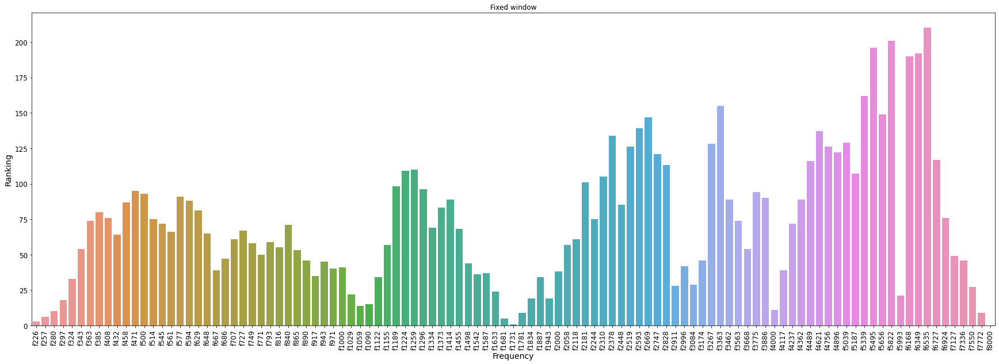

In [142]:
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [30, 10]
sb.barplot(x='Frequency',y='Ranking',data=fnew)
plt.xticks(rotation=90)
plt.title("Fixed window");

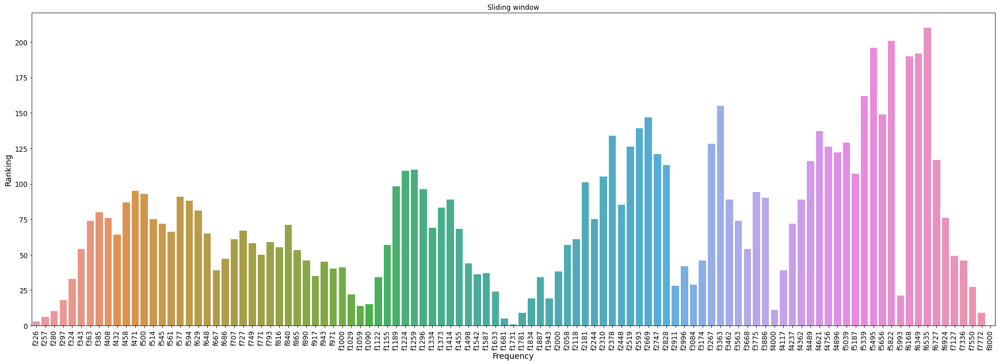

In [81]:
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [30, 10]
sb.barplot(x='Frequency',y='Ranking',data=fnew)
plt.xticks(rotation=90)
plt.title("Sliding window");

In [82]:
from sklearn.decomposition import PCA
from sklearn.feature_selection import VarianceThreshold
from sklearn.svm import SVC
from sklearn.feature_selection import RFECV
from sklearn.model_selection import StratifiedKFold
from sklearn.feature_selection import RFE
from sklearn.model_selection import cross_val_score

### Feature selection RFE with Cross Val

Optimal number of features : 12


C:\Users\AndyJ\anaconda3\envs\py\lib\site-packages\sklearn\utils\deprecation.py:103: FutureWarning: The `grid_scores_` attribute is deprecated in version 1.0 in favor of `cv_results_` and will be removed in version 1.2.
  warnings.warn(msg, category=FutureWarning)


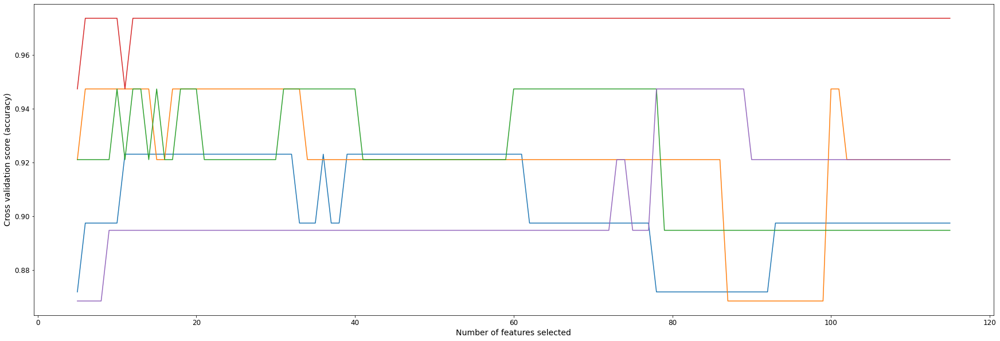

In [189]:
import matplotlib.pyplot as plt
from sklearn.svm import SVC
from sklearn.model_selection import StratifiedKFold
from sklearn.feature_selection import RFECV
from sklearn.datasets import make_classification


# Create the RFE object and compute a cross-validated score.
svc = SVC(kernel="linear")
# The "accuracy" scoring shows the proportion of correct classifications

min_features_to_select = 5  # Minimum number of features to consider
rfecv = RFECV(
    estimator=svc,
    step=1,
    cv=StratifiedKFold(5),
    scoring="accuracy",
    min_features_to_select=min_features_to_select,
)
rfecv.fit(X_train, Y_train)

print("Optimal number of features : %d" % rfecv.n_features_)

# Plot number of features VS. cross-validation scores
plt.figure()
plt.xlabel("Number of features selected")
plt.ylabel("Cross validation score (accuracy)")
plt.plot(
    range(min_features_to_select, len(rfecv.grid_scores_) + min_features_to_select),
    rfecv.grid_scores_,
)
plt.show()

In [190]:
d={'freq':rfecv.feature_names_in_,'rank':rfecv.ranking_}
feature_rankings=pd.DataFrame(data=d).sort_values(by='rank',ascending=True)
feature_rankings.reset_index(drop=True, inplace=True)
feature_rankings.head(20)

,freq,rank
0,f1943,1
1,f1029,1
2,f1059,1
3,f1090,1
4,f1122,1
5,f1296,1
6,f1334,1
7,f1373,1
8,f4000,1
9,f1414,1


## SVM RBF

In [119]:
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline as pipe

rbf_svc=pipe([
    ("scaler",StandardScaler()),
    ("svm_clf",SVC(kernel="rbf",gamma=0.01,C=1))
])
rbf_svc.fit(X_train, Y_train)

Pipeline(steps=[('scaler', StandardScaler()),
                ('svm_clf', SVC(C=1, gamma=0.01))])

In [120]:
y_pred=rbf_svc.predict(x_test)
y_pred

array([0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0,
       0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1,
       0, 0, 0, 0], dtype=int64)

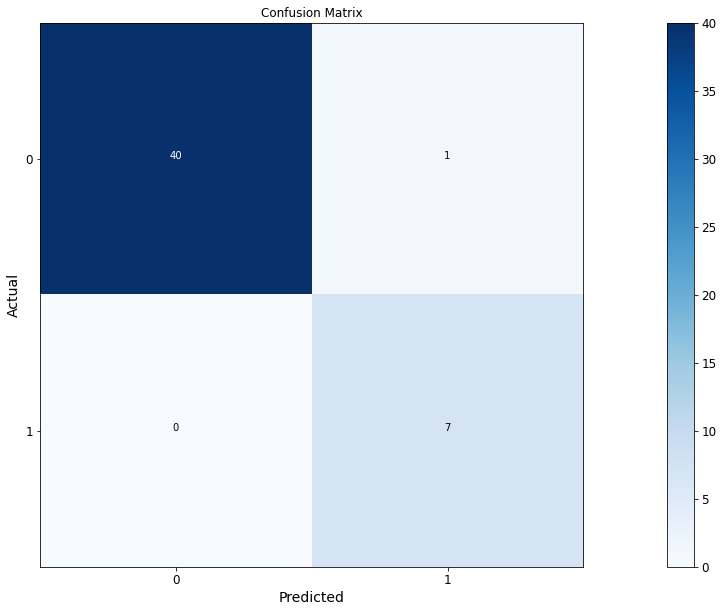

In [122]:
plt.imshow(cf,cmap=plt.cm.Blues,interpolation='nearest')
plt.colorbar()
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
tick_marks = np.arange(len(set(y_pred))) # length of classes
class_labels = ['0','1']
tick_marks
plt.xticks(tick_marks,class_labels)
plt.yticks(tick_marks,class_labels)
# plotting text value inside cells
thresh = cf.max() / 2.
for i,j in itertools.product(range(cf.shape[0]),range(cf.shape[1])):
    plt.text(j,i,format(cf[i,j],'d'),horizontalalignment='center',color='white' if cf[i,j] >thresh else 'black')
plt.show();

In [121]:
from sklearn.metrics import classification_report, confusion_matrix
cf=confusion_matrix(y_test,y_pred)
print(confusion_matrix(y_test,y_pred))
print(classification_report(y_test,y_pred))

[[40  1]
 [ 0  7]]
              precision    recall  f1-score   support

           0       1.00      0.98      0.99        41
           1       0.88      1.00      0.93         7

    accuracy                           0.98        48
   macro avg       0.94      0.99      0.96        48
weighted avg       0.98      0.98      0.98        48



## ROC Analysis

C:\Users\AndyJ\anaconda3\envs\py\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metrics.RocCurveDisplay.from_predictions` or :meth:`sklearn.metrics.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


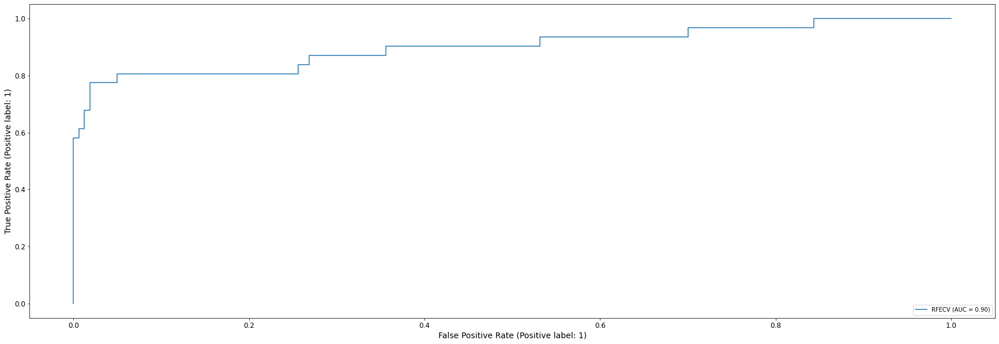

In [99]:
from sklearn.metrics import plot_roc_curve
plot_roc_curve(rfecv, X_train,Y_train )

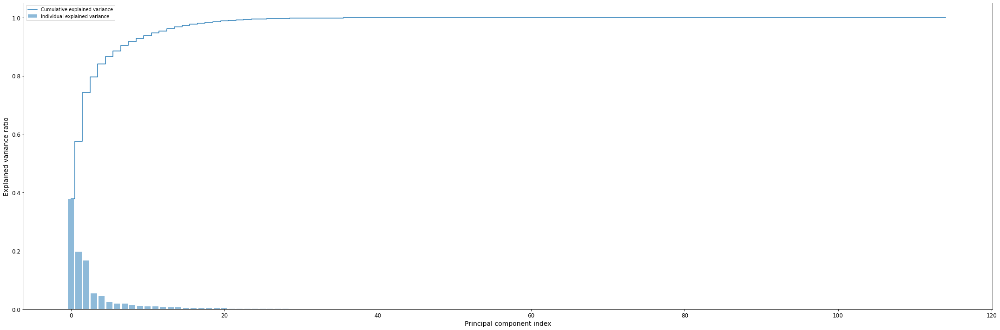

In [191]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
sc.fit(X_train)
X_train_std = sc.transform(X_train)
X_test_std = sc.transform(x_test)
#
# Instantiate PCA
#
pca = PCA()
#
# Determine transformed features
#
X_train_pca = pca.fit_transform(X_train_std)
#
# Determine explained variance using explained_variance_ration_ attribute
#
exp_var_pca = pca.explained_variance_ratio_
#
# Cumulative sum of eigenvalues; This will be used to create step plot
# for visualizing the variance explained by each principal component.
#
cum_sum_eigenvalues = np.cumsum(exp_var_pca)
#
# Create the visualization plot
#
plt.bar(range(0,len(exp_var_pca)), exp_var_pca, alpha=0.5, align='center', label='Individual explained variance')
plt.step(range(0,len(cum_sum_eigenvalues)), cum_sum_eigenvalues, where='mid',label='Cumulative explained variance')
plt.ylabel('Explained variance ratio')
plt.xlabel('Principal component index')
plt.legend(loc='best')
plt.tight_layout()
plt.show()

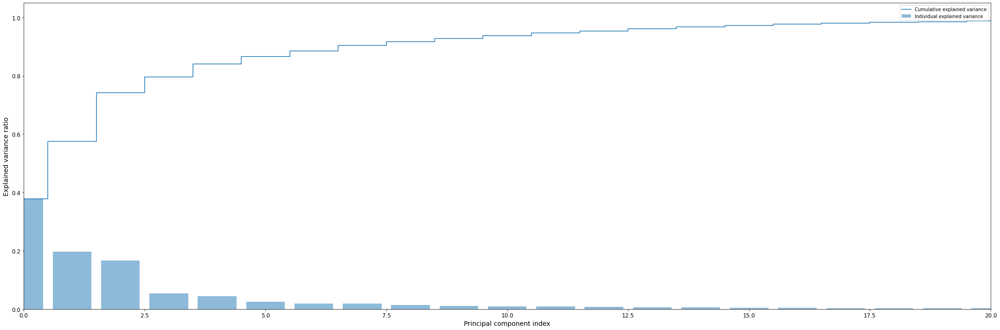

In [192]:
plt.bar(range(0,len(exp_var_pca)), exp_var_pca, alpha=0.5, align='center', label='Individual explained variance')
plt.step(range(0,len(cum_sum_eigenvalues)), cum_sum_eigenvalues, where='mid',label='Cumulative explained variance')
plt.ylabel('Explained variance ratio')
plt.xlabel('Principal component index')
plt.legend(loc='best')
plt.tight_layout()
plt.xlim(0,20)
plt.show()

In [190]:
d={'freq':rfecv.feature_names_in_,'rank':rfecv.ranking_}
feature_rankings=pd.DataFrame(data=d).sort_values(by='rank',ascending=True)
feature_rankings.reset_index(drop=True, inplace=True)
feature_rankings.head(20)

,freq,rank
0,f1943,1
1,f1029,1
2,f1059,1
3,f1090,1
4,f1122,1
5,f1296,1
6,f1334,1
7,f1373,1
8,f4000,1
9,f1414,1


## PCA Visualisation

## PCA Explained Variance - All frequencies

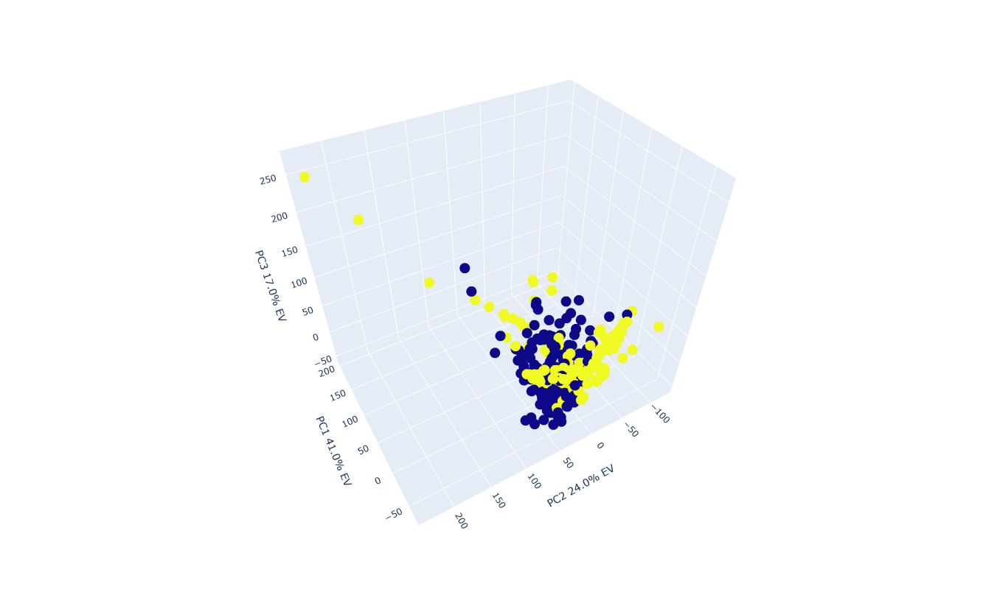

In [165]:
import plotly.express as px
from sklearn.decomposition import PCA

df = X_train
y=y_train
X= df.filter(regex='fy.*')

pca = PCA(n_components=3)
components = pca.fit_transform(X)

total_var = pca.explained_variance_ratio_.sum() * 100
total_pc1_var = pca.explained_variance_ratio_[0] * 100
total_pc2_var = pca.explained_variance_ratio_[1] * 100
total_pc3_var = pca.explained_variance_ratio_[2] * 100

ano1='PC1'+' '+str(round(total_pc1_var,0)) + '% EV'
ano2='PC2'+' '+str(round(total_pc2_var,0)) + '% EV'
ano3='PC3'+' '+str(round(total_pc3_var,0)) + '% EV'

fig = px.scatter_3d(
    components, x=0, y=1, z=2, color=y['OverallPoF'],
    # title=f'Total Explained Variance: {total_var:.2f}%',
    # labels={'0': 'PC 1'+round(total_pc1_var,0), '1': 'PC 2', '2': 'PC 3'},
    labels={'0': ano1, '1': ano2, '2': ano3},
    width=800, height=800
)
fig.update(layout_coloraxis_showscale=False)
fig.show()


## SVM RBF - With selected frequencies

In [328]:
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline as pipe

df = X_train
y=Y_train
X = df[['f1000','f1029', 'f1059', 'f1090','f1122','f1296','f1334','f1373','f1414']]
xtest=x_test[['f1000','f1029', 'f1059', 'f1090','f1122','f1296','f1334','f1373','f1414']]

# X = df[['f1000','f1029', 'f1059', 'f1090']]
# xtest=x_test[['f1000','f1029', 'f1059', 'f1090']]


rbf_svc=pipe([
    ("scaler",StandardScaler()),
    ("svm_clf",SVC(kernel="rbf",gamma=0.01,C=1))
])
rbf_svc.fit(X, y)

Pipeline(steps=[('scaler', StandardScaler()),
                ('svm_clf', SVC(C=1, gamma=0.01))])

In [329]:
y_pred=rbf_svc.predict(xtest)
y_pred

array([0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0,
       0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1,
       0, 0, 0, 0], dtype=int64)

In [330]:
from sklearn.metrics import classification_report, confusion_matrix
cf=confusion_matrix(y_test,y_pred)
print(confusion_matrix(y_test,y_pred))
print(classification_report(y_test,y_pred))

[[40  1]
 [ 0  7]]
              precision    recall  f1-score   support

           0       1.00      0.98      0.99        41
           1       0.88      1.00      0.93         7

    accuracy                           0.98        48
   macro avg       0.94      0.99      0.96        48
weighted avg       0.98      0.98      0.98        48



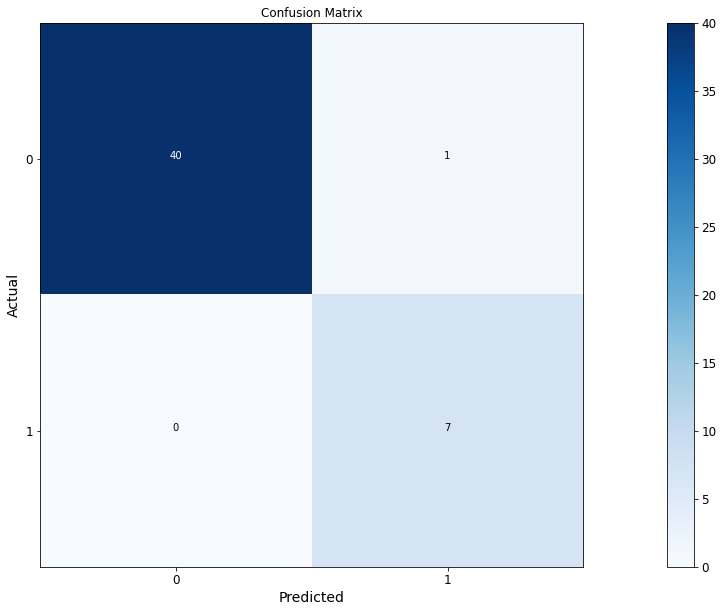

In [331]:
plt.imshow(cf,cmap=plt.cm.Blues,interpolation='nearest')
plt.colorbar()
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
tick_marks = np.arange(len(set(y_pred))) # length of classes
class_labels = ['0','1']
tick_marks
plt.xticks(tick_marks,class_labels)
plt.yticks(tick_marks,class_labels)
# plotting text value inside cells
thresh = cf.max() / 2.
for i,j in itertools.product(range(cf.shape[0]),range(cf.shape[1])):
    plt.text(j,i,format(cf[i,j],'d'),horizontalalignment='center',color='white' if cf[i,j] >thresh else 'black')
plt.show();

## SMOTE Resampling method - SVM RBF

In [351]:
from imblearn.over_sampling import SMOTE

sm = SMOTE(random_state=12)
X_sm, y_sm = sm.fit_resample(X_train, Y_train)


In [352]:
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline as pipe

df = X_sm
y=y_sm
X = df[['f1000','f1029', 'f1059', 'f1090','f1122','f1296','f1334','f1373','f1414']]
xtest=x_test[['f1000','f1029', 'f1059', 'f1090','f1122','f1296','f1334','f1373','f1414']]

# X = df[['f1000','f1029', 'f1059', 'f1090']]
# xtest=x_test[['f1000','f1029', 'f1059', 'f1090']]


rbf_svc=pipe([
    ("scaler",StandardScaler()),
    ("svm_clf",SVC(kernel="rbf",gamma=0.01,C=1))
])
rbf_svc.fit(X, y)

Pipeline(steps=[('scaler', StandardScaler()),
                ('svm_clf', SVC(C=1, gamma=0.01))])

In [353]:
y_pred=rbf_svc.predict(xtest)
y_pred

array([0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0,
       0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1,
       0, 0, 0, 0], dtype=int64)

In [354]:
from sklearn.metrics import classification_report, confusion_matrix
cf=confusion_matrix(y_test,y_pred)
print(confusion_matrix(y_test,y_pred))
print(classification_report(y_test,y_pred))

[[37  4]
 [ 0  7]]
              precision    recall  f1-score   support

           0       1.00      0.90      0.95        41
           1       0.64      1.00      0.78         7

    accuracy                           0.92        48
   macro avg       0.82      0.95      0.86        48
weighted avg       0.95      0.92      0.92        48



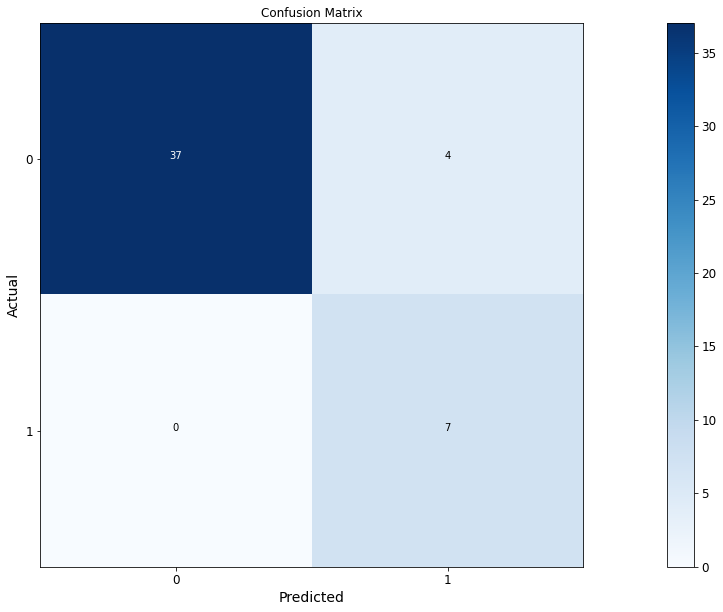

In [355]:
plt.imshow(cf,cmap=plt.cm.Blues,interpolation='nearest')
plt.colorbar()
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
tick_marks = np.arange(len(set(y_pred))) # length of classes
class_labels = ['0','1']
tick_marks
plt.xticks(tick_marks,class_labels)
plt.yticks(tick_marks,class_labels)
# plotting text value inside cells
thresh = cf.max() / 2.
for i,j in itertools.product(range(cf.shape[0]),range(cf.shape[1])):
    plt.text(j,i,format(cf[i,j],'d'),horizontalalignment='center',color='white' if cf[i,j] >thresh else 'black')
plt.show();

In [361]:
from sklearn.metrics import roc_curve, auc
from sklearn.linear_model import SGDClassifier 

model = SGDClassifier(loss='hinge',class_weight='balanced')
model.fit(X_train, Y_train)
# roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class, not the predicted outputs.

y_train_pred = model.decision_function(X_train)    
y_test_pred = model.decision_function(x_test) 

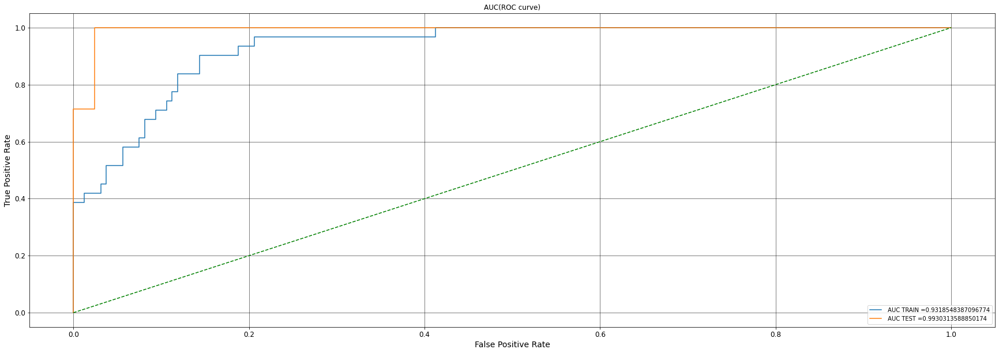

In [363]:
train_fpr, train_tpr, tr_thresholds = roc_curve(Y_train, y_train_pred)
test_fpr, test_tpr, te_thresholds = roc_curve(y_test, y_test_pred)

plt.grid()

plt.plot(train_fpr, train_tpr, label=" AUC TRAIN ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label=" AUC TEST ="+str(auc(test_fpr, test_tpr)))
plt.plot([0,1],[0,1],'g--')
plt.legend()
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("AUC(ROC curve)")
plt.grid(color='black', linestyle='-', linewidth=0.5)
plt.show()

## PCA Explained Variance - Frequency range between 1000Hz-1414Hz with SMOTE

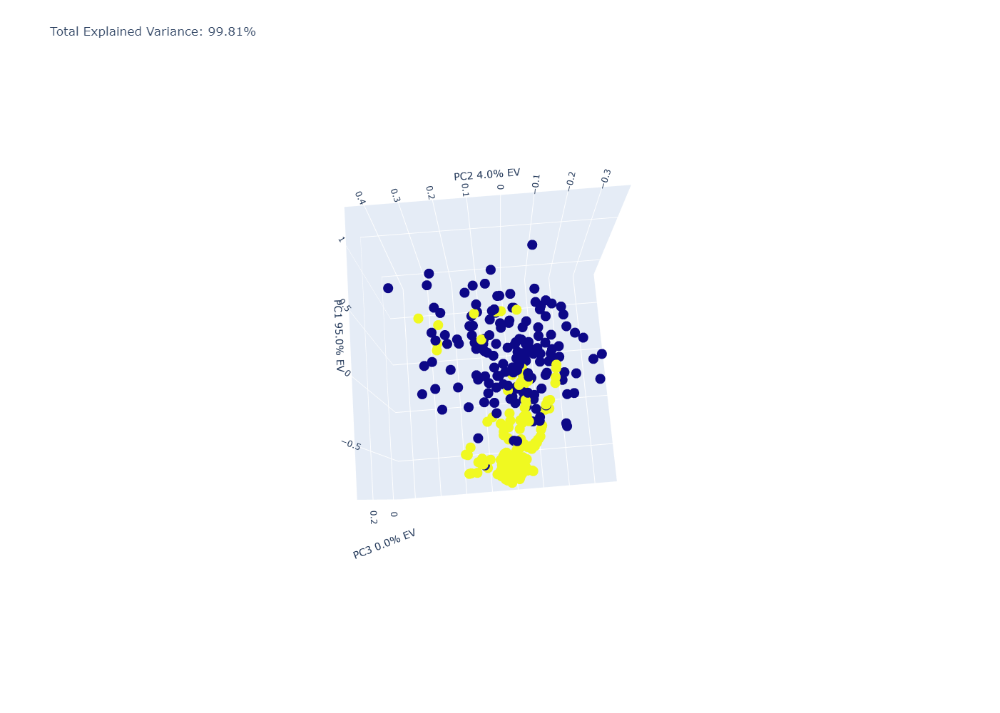

In [16]:
import plotly.express as px
from sklearn.decomposition import PCA
from imblearn.over_sampling import SMOTE


sm = SMOTE(random_state=12)
X_sm, y_sm = sm.fit_resample(X_train, Y_train)

df = X_sm
y=y_sm
X = df[['f1000','f1029', 'f1059', 'f1090','f1122','f1296','f1334','f1373','f1414']]


pca = PCA(n_components=3)
components = pca.fit_transform(X)

total_var = pca.explained_variance_ratio_.sum() * 100
total_pc1_var = pca.explained_variance_ratio_[0] * 100
total_pc2_var = pca.explained_variance_ratio_[1] * 100
total_pc3_var = pca.explained_variance_ratio_[2] * 100

ano1='PC1'+' '+str(round(total_pc1_var,0)) + '% EV'
ano2='PC2'+' '+str(round(total_pc2_var,0)) + '% EV'
ano3='PC3'+' '+str(round(total_pc3_var,0)) + '% EV'

fig = px.scatter_3d(
    components, x=0, y=1, z=2, color=y,
    title=f'Total Explained Variance: {total_var:.2f}%',
    labels={'0': ano1, '1': ano2, '2': ano3},
    width=1000, height=1000
)
fig.update(layout_coloraxis_showscale=False)
fig.show()


## Frequency plots

In [72]:
freq=X_train1.filter(regex="f.*")
freq_t=freq.T

In [73]:
freq1=freq_t.iloc[:,5]
freq1

fa226     0.0663
fa257     0.0757
fa280     0.0951
fa297     0.1212
fa324     0.1458
           ...  
fa7127    0.1231
fa7336    0.0961
fa7550    0.0916
fa7772    0.0789
fa8000    0.0586
Name: 5, Length: 107, dtype: float64

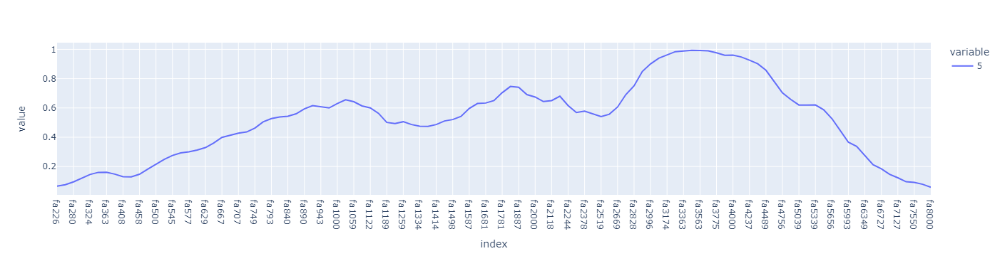

In [74]:
import plotly.express as px
px.line(freq1)

# Archive code

In [ ]:
data.columns.get_loc("Ear.coded")+1

In [25]:
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

X = X_train1.loc[:, X_train1.columns.isin(['fa1000', 'fa1029', 'fa1155', 'fa1189', 'fa1224', 'fa1259', 'fa1296', 'fa1334', 'fa1373', 'fa1414'])]

vif_info = pd.DataFrame()
vif_info['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif_info['Column'] = X.columns
vif_info.sort_values('VIF', ascending=False)

,VIF,Column
4,104866.531770,fa1224
3,82557.226424,fa1189
5,74983.418976,fa1259
6,73403.533080,fa1296
7,64267.081904,fa1334
8,47154.071160,fa1373
2,21461.362669,fa1155
9,10606.585888,fa1414
1,9266.253952,fa1029
0,4735.964453,fa1000


In [ ]:
test=data.filter(regex=("f.*")).head(5)

In [52]:
a_data.columns.get_loc("EarSide")

13

In [3]:
iris = datasets.load_iris()
X = iris["data"][:, (2, 3)] # petal length, petal width
y = (iris["target"] == 2).astype(np.float64) # Iris virginica
svm_clf = Pipeline([
("scaler", StandardScaler()),
("linear_svc", LinearSVC(C=1, loss="hinge")),
])
svm_clf.fit(X, y)

NameError: name 'LinearSVC' is not defined

In [11]:
svm_clf.predict([[5.5, 1.7]])

array([1.])

Saving figure higher_dimensions_plot


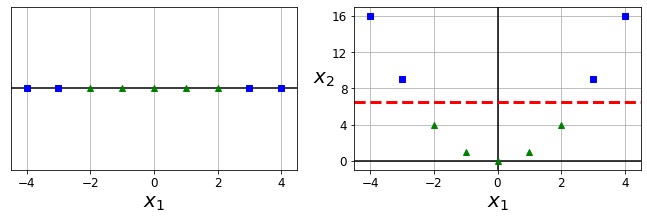

In [17]:
X1D = np.linspace(-4, 4, 9).reshape(-1, 1)
X2D = np.c_[X1D, X1D**2]
y = np.array([0, 0, 1, 1, 1, 1, 1, 0, 0])

plt.figure(figsize=(10, 3))

plt.subplot(121)
plt.grid(True, which='both')
plt.axhline(y=0, color='k')
plt.plot(X1D[:, 0][y==0], np.zeros(4), "bs")
plt.plot(X1D[:, 0][y==1], np.zeros(5), "g^")
plt.gca().get_yaxis().set_ticks([])
plt.xlabel(r"$x_1$", fontsize=20)
plt.axis([-4.5, 4.5, -0.2, 0.2])

plt.subplot(122)
plt.grid(True, which='both')
plt.axhline(y=0, color='k')
plt.axvline(x=0, color='k')
plt.plot(X2D[:, 0][y==0], X2D[:, 1][y==0], "bs")
plt.plot(X2D[:, 0][y==1], X2D[:, 1][y==1], "g^")
plt.xlabel(r"$x_1$", fontsize=20)
plt.ylabel(r"$x_2$  ", fontsize=20, rotation=0)
plt.gca().get_yaxis().set_ticks([0, 4, 8, 12, 16])
plt.plot([-4.5, 4.5], [6.5, 6.5], "r--", linewidth=3)
plt.axis([-4.5, 4.5, -1, 17])

plt.subplots_adjust(right=1)

save_fig("higher_dimensions_plot", tight_layout=False)
plt.show()

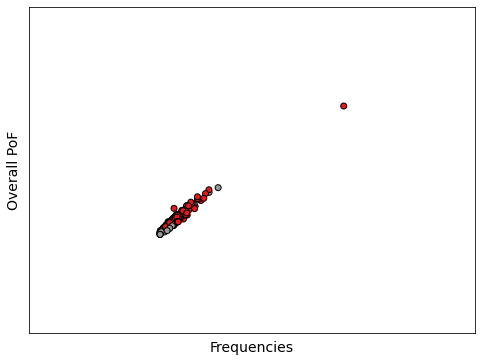

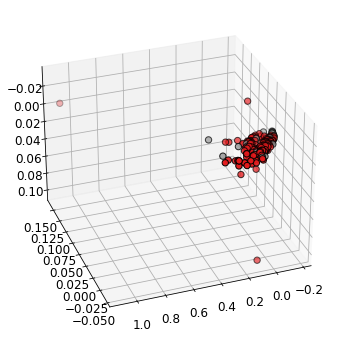

In [98]:
xtrain_a=a_data.iloc[:,[14,15,16,17]]
xtrain_a=xtrain_a.to_numpy()
type(xtrain_a)

ytrain_a=a_data.iloc[:,[12]]
ytrain_a=ytrain_a.to_numpy()

import matplotlib.pyplot as plt

# unused but required import for doing 3d projections with matplotlib < 3.2
import mpl_toolkits.mplot3d  # noqa: F401

from sklearn import datasets
from sklearn.decomposition import PCA

# import some data to play with

X = xtrain_a
y = ytrain_a

x_min, x_max = X[:, 0].min() - 0.5, X[:, 0].max() + 0.5
y_min, y_max = X[:, 1].min() - 0.5, X[:, 1].max() + 0.5

plt.figure(2, figsize=(8, 6))
plt.clf()

# Plot the training points
plt.scatter(X[:, 0], X[:, 1], c=y, cmap=plt.cm.Set1, edgecolor="k")
plt.xlabel("Frequencies")
plt.ylabel("Overall PoF")

plt.xlim(x_min, x_max)
plt.ylim(y_min, y_max)
plt.xticks(())
plt.yticks(())

# To getter a better understanding of interaction of the dimensions
# plot the first three PCA dimensions
fig = plt.figure(1, figsize=(8, 6))
ax = fig.add_subplot(111, projection="3d", elev=-150, azim=110)

X_reduced = PCA(n_components=3).fit_transform(xtrain_a)
ax.scatter(
    X_reduced[:, 0],
    X_reduced[:, 1],
    X_reduced[:, 2],
    c=y,
    cmap=plt.cm.Set1,
    edgecolor="k",
    s=40,
)

# # ax.set_title("First three PCA directions")
# # ax.set_xlabel("1st eigenvector")
# # ax.w_xaxis.set_ticklabels([])
# # ax.set_ylabel("2nd eigenvector")
# # ax.w_yaxis.set_ticklabels([])
# # ax.set_zlabel("3rd eigenvector")
# # ax.w_zaxis.set_ticklabels([])

# plt.show()

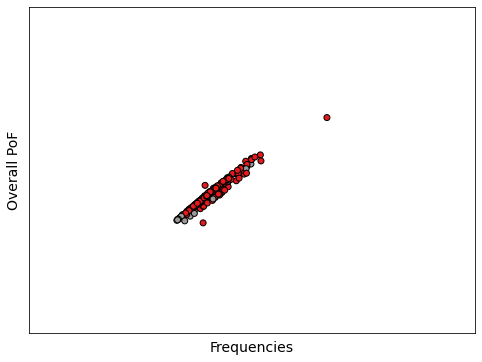

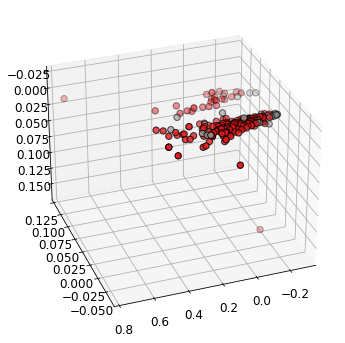

In [100]:
xtrain_a=a_data.iloc[:,20:25]
xtrain_a=xtrain_a.to_numpy()
type(xtrain_a)

ytrain_a=a_data.iloc[:,[12]]
ytrain_a=ytrain_a.to_numpy()

import matplotlib.pyplot as plt

# unused but required import for doing 3d projections with matplotlib < 3.2
import mpl_toolkits.mplot3d  # noqa: F401

from sklearn import datasets
from sklearn.decomposition import PCA

# import some data to play with

X = xtrain_a
y = ytrain_a

x_min, x_max = X[:, 0].min() - 0.5, X[:, 0].max() + 0.5
y_min, y_max = X[:, 1].min() - 0.5, X[:, 1].max() + 0.5

plt.figure(2, figsize=(8, 6))
plt.clf()

# Plot the training points
plt.scatter(X[:, 0], X[:, 1], c=y, cmap=plt.cm.Set1, edgecolor="k")
plt.xlabel("Frequencies")
plt.ylabel("Overall PoF")

plt.xlim(x_min, x_max)
plt.ylim(y_min, y_max)
plt.xticks(())
plt.yticks(())

# To getter a better understanding of interaction of the dimensions
# plot the first three PCA dimensions
fig = plt.figure(1, figsize=(8, 6))
ax = fig.add_subplot(111, projection="3d", elev=-150, azim=110)

X_reduced = PCA(n_components=3).fit_transform(xtrain_a)
ax.scatter(
    X_reduced[:, 0],
    X_reduced[:, 1],
    X_reduced[:, 2],
    c=y,
    cmap=plt.cm.Set1,
    edgecolor="k",
    s=40,
)

# # ax.set_title("First three PCA directions")
# # ax.set_xlabel("1st eigenvector")
# # ax.w_xaxis.set_ticklabels([])
# # ax.set_ylabel("2nd eigenvector")
# # ax.w_yaxis.set_ticklabels([])
# # ax.set_zlabel("3rd eigenvector")
# # ax.w_zaxis.set_ticklabels([])

# plt.show()

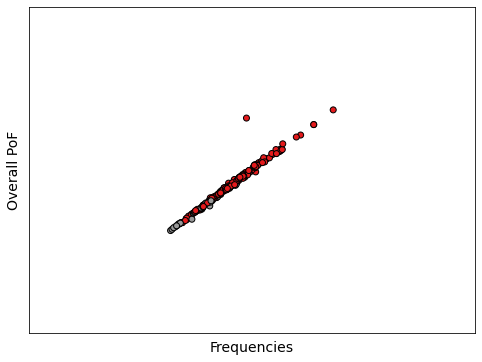

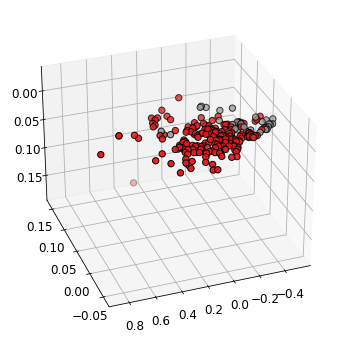

In [101]:
xtrain_a=a_data.iloc[:,30:35]
xtrain_a=xtrain_a.to_numpy()
type(xtrain_a)

ytrain_a=a_data.iloc[:,[12]]
ytrain_a=ytrain_a.to_numpy()

import matplotlib.pyplot as plt

# unused but required import for doing 3d projections with matplotlib < 3.2
import mpl_toolkits.mplot3d  # noqa: F401

from sklearn import datasets
from sklearn.decomposition import PCA

# import some data to play with

X = xtrain_a
y = ytrain_a

x_min, x_max = X[:, 0].min() - 0.5, X[:, 0].max() + 0.5
y_min, y_max = X[:, 1].min() - 0.5, X[:, 1].max() + 0.5

plt.figure(2, figsize=(8, 6))
plt.clf()

# Plot the training points
plt.scatter(X[:, 0], X[:, 1], c=y, cmap=plt.cm.Set1, edgecolor="k")
plt.xlabel("Frequencies")
plt.ylabel("Overall PoF")

plt.xlim(x_min, x_max)
plt.ylim(y_min, y_max)
plt.xticks(())
plt.yticks(())

# To getter a better understanding of interaction of the dimensions
# plot the first three PCA dimensions
fig = plt.figure(1, figsize=(8, 6))
ax = fig.add_subplot(111, projection="3d", elev=-150, azim=110)

X_reduced = PCA(n_components=3).fit_transform(xtrain_a)
ax.scatter(
    X_reduced[:, 0],
    X_reduced[:, 1],
    X_reduced[:, 2],
    c=y,
    cmap=plt.cm.Set1,
    edgecolor="k",
    s=40,
)

# # ax.set_title("First three PCA directions")
# # ax.set_xlabel("1st eigenvector")
# # ax.w_xaxis.set_ticklabels([])
# # ax.set_ylabel("2nd eigenvector")
# # ax.w_yaxis.set_ticklabels([])
# # ax.set_zlabel("3rd eigenvector")
# # ax.w_zaxis.set_ticklabels([])

# plt.show()

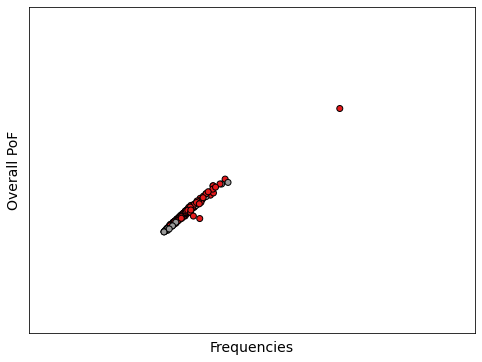

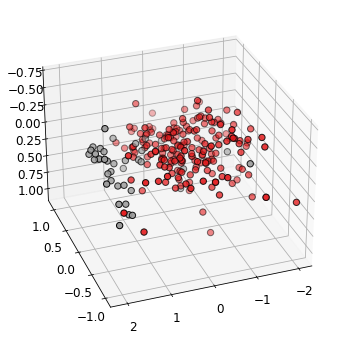

In [112]:
xtrain_a=a_data.iloc[:,15:70]
xtrain_a=xtrain_a.to_numpy()
type(xtrain_a)

ytrain_a=a_data.iloc[:,[12]]
ytrain_a=ytrain_a.to_numpy()

import matplotlib.pyplot as plt

# unused but required import for doing 3d projections with matplotlib < 3.2
import mpl_toolkits.mplot3d  # noqa: F401

from sklearn import datasets
from sklearn.decomposition import PCA

# import some data to play with

X = xtrain_a
y = ytrain_a

x_min, x_max = X[:, 0].min() - 0.5, X[:, 0].max() + 0.5
y_min, y_max = X[:, 1].min() - 0.5, X[:, 1].max() + 0.5

plt.figure(2, figsize=(8, 6))
plt.clf()

# Plot the training points
plt.scatter(X[:, 0], X[:, 1], c=y, cmap=plt.cm.Set1, edgecolor="k")
plt.xlabel("Frequencies")
plt.ylabel("Overall PoF")

plt.xlim(x_min, x_max)
plt.ylim(y_min, y_max)
plt.xticks(())
plt.yticks(())

# To getter a better understanding of interaction of the dimensions
# plot the first three PCA dimensions
fig = plt.figure(1, figsize=(8, 6))
ax = fig.add_subplot(111, projection="3d", elev=-150, azim=110)

X_reduced = PCA(n_components=3).fit_transform(xtrain_a)
ax.scatter(
    X_reduced[:, 0],
    X_reduced[:, 1],
    X_reduced[:, 2],
    c=y,
    cmap=plt.cm.Set1,
    edgecolor="k",
    s=40,
)

# # ax.set_title("First three PCA directions")
# # ax.set_xlabel("1st eigenvector")
# # ax.w_xaxis.set_ticklabels([])
# # ax.set_ylabel("2nd eigenvector")
# # ax.w_yaxis.set_ticklabels([])
# # ax.set_zlabel("3rd eigenvector")
# # ax.w_zaxis.set_ticklabels([])

# plt.show()

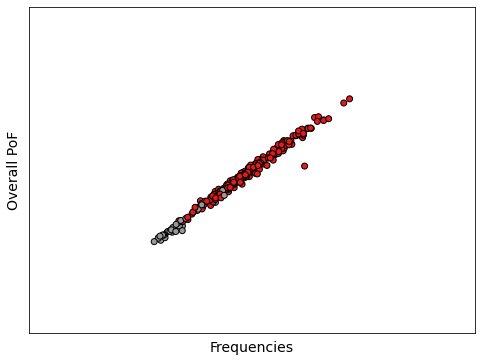

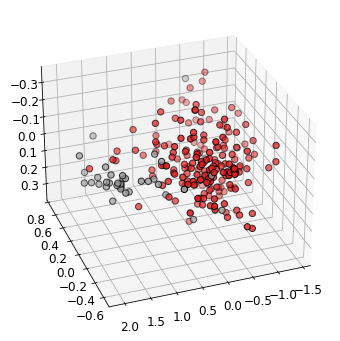

In [106]:
xtrain_a=a_data.iloc[:,50:70]
xtrain_a=xtrain_a.to_numpy()
type(xtrain_a)

ytrain_a=a_data.iloc[:,[12]]
ytrain_a=ytrain_a.to_numpy()

import matplotlib.pyplot as plt

# unused but required import for doing 3d projections with matplotlib < 3.2
import mpl_toolkits.mplot3d  # noqa: F401

from sklearn import datasets
from sklearn.decomposition import PCA

# import some data to play with

X = xtrain_a
y = ytrain_a

x_min, x_max = X[:, 0].min() - 0.5, X[:, 0].max() + 0.5
y_min, y_max = X[:, 1].min() - 0.5, X[:, 1].max() + 0.5

plt.figure(2, figsize=(8, 6))
plt.clf()

# Plot the training points
plt.scatter(X[:, 0], X[:, 1], c=y, cmap=plt.cm.Set1, edgecolor="k")
plt.xlabel("Frequencies")
plt.ylabel("Overall PoF")

plt.xlim(x_min, x_max)
plt.ylim(y_min, y_max)
plt.xticks(())
plt.yticks(())

# To getter a better understanding of interaction of the dimensions
# plot the first three PCA dimensions
fig = plt.figure(1, figsize=(8, 6))
ax = fig.add_subplot(111, projection="3d", elev=-150, azim=110)

X_reduced = PCA(n_components=3).fit_transform(xtrain_a)
ax.scatter(
    X_reduced[:, 0],
    X_reduced[:, 1],
    X_reduced[:, 2],
    c=y,
    cmap=plt.cm.Set1,
    edgecolor="k",
    s=40,
)

# # ax.set_title("First three PCA directions")
# # ax.set_xlabel("1st eigenvector")
# # ax.w_xaxis.set_ticklabels([])
# # ax.set_ylabel("2nd eigenvector")
# # ax.w_yaxis.set_ticklabels([])
# # ax.set_zlabel("3rd eigenvector")
# # ax.w_zaxis.set_ticklabels([])

# plt.show()



ModuleNotFoundError: No module named 'plotly'

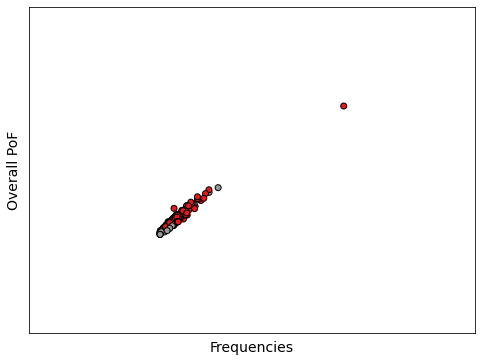

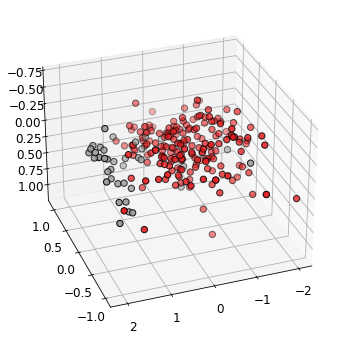

In [110]:
xtrain_a=a_data.iloc[:,14:70]
xtrain_a=xtrain_a.to_numpy()
type(xtrain_a)

ytrain_a=a_data.iloc[:,[12]]
ytrain_a=ytrain_a.to_numpy()

import matplotlib.pyplot as plt

# unused but required import for doing 3d projections with matplotlib < 3.2
import mpl_toolkits.mplot3d  # noqa: F401

from sklearn import datasets
from sklearn.decomposition import PCA

# import some data to play with

X = xtrain_a
y = ytrain_a

x_min, x_max = X[:, 0].min() - 0.5, X[:, 0].max() + 0.5
y_min, y_max = X[:, 1].min() - 0.5, X[:, 1].max() + 0.5

plt.figure(2, figsize=(8, 6))
plt.clf()

# Plot the training points
plt.scatter(X[:, 0], X[:, 1], c=y, cmap=plt.cm.Set1, edgecolor="k")
plt.xlabel("Frequencies")
plt.ylabel("Overall PoF")

plt.xlim(x_min, x_max)
plt.ylim(y_min, y_max)
plt.xticks(())
plt.yticks(())

# To getter a better understanding of interaction of the dimensions
# plot the first three PCA dimensions
fig = plt.figure(1, figsize=(8, 6))
ax = fig.add_subplot(111, projection="3d", elev=-150, azim=110)

X_reduced = PCA(n_components=3).fit_transform(xtrain_a)
ax.scatter(
    X_reduced[:, 0],
    X_reduced[:, 1],
    X_reduced[:, 2],
    c=y,
    cmap=plt.cm.Set1,
    edgecolor="k",
    s=40,
)

# # ax.set_title("First three PCA directions")
# # ax.set_xlabel("1st eigenvector")
# # ax.w_xaxis.set_ticklabels([])
# # ax.set_ylabel("2nd eigenvector")
# # ax.w_yaxis.set_ticklabels([])
# # ax.set_zlabel("3rd eigenvector")
# # ax.w_zaxis.set_ticklabels([])

# plt.show()

import plotly.express as px
df = px.X_reduced
fig = px.scatter_3d(df, x='sepal_length', y='sepal_width', z='petal_width',
              color='species')
fig.show()

In [109]:
X_reduced

array([[ 1.66328610e+00,  8.36608085e-02, -4.45278187e-02],
       [ 6.11331570e-02,  1.16640289e-01,  5.93475387e-02],
       [-2.08007669e-01,  3.59607440e-03, -1.31390211e-01],
       [-5.65338228e-01,  3.56340831e-01,  6.61622355e-02],
       [-5.25506899e-01,  7.35547114e-01, -2.22206041e-01],
       [ 1.52839520e+00, -3.75086143e-02,  1.03531088e-02],
       [-8.13448122e-01, -4.33759486e-02, -1.61169640e-01],
       [-7.59014647e-01,  1.39773992e-01,  1.36189472e-01],
       [ 1.12433899e+00, -3.23949052e-02,  1.70481349e-01],
       [ 9.43949816e-02,  2.90696319e-01, -1.70558497e-01],
       [ 1.84910197e+00,  2.49142487e-01,  1.65085911e-02],
       [ 1.29112335e+00,  2.91058197e-01,  1.50632707e-02],
       [ 2.34869148e-01, -1.39977885e-02,  8.94884154e-02],
       [ 6.04551337e-01,  1.66229994e-01, -2.09841493e-01],
       [ 4.22601556e-01,  2.51903359e-01, -2.36559137e-01],
       [ 1.86044055e-01, -6.24917647e-01, -8.18218726e-03],
       [-1.26382116e+00,  2.14479001e-01